# AWS SaaS Sales Analysis

## Tentang Data

AWS SaaS (Amazon Web Services Software-as-a-Service)  
  
AWS SaaS adalah model pengiriman perangkat lunak di mana aplikasi dihosting oleh penyedia layanan cloud dan tersedia untuk pelanggan melalui internet.

Beberapa poin penting tentang AWS SaaS:  
  
- Berbasis cloud: Aplikasi diakses melalui internet, sehingga pelanggan tidak perlu menginstal atau memelihara perangkat lunak di komputer mereka.  
- Model berlangganan: Pelanggan biasanya membayar biaya berlangganan untuk menggunakan perangkat lunak.  
- Skalabilitas: Penyedia layanan cloud menangani penskalaan infrastruktur, sehingga aplikasi dapat menangani peningkatan permintaan.  
- Pemeliharaan: Penyedia layanan cloud bertanggung jawab untuk pemeliharaan dan pembaruan perangkat lunak.  
   
Dalam konteks dataset ini:  

Dataset ini berisi catatan transaksi penjualan dari NimbusTech, sebuah perusahaan teknologi yang menyediakan platform penjualan dan pemasaran berbasis AWS SaaS kepada klien bisnis di berbagai industri. Dataset mencakup informasi tentang transaksi penjualan ini, seperti produk yang dibeli, pelanggan yang melakukan pembelian, dan detail keuangan dari setiap transaksi.

## Pernyataan Masalah

Bagaimana AWS dapat meningkatkan penjualan dan profitabilitas melalui identifikasi faktor-faktor utama yang memengaruhi performa produk SaaS, perilaku pelanggan, dan efektivitas diskon di berbagai negara dan industri?

## Tujuan Analisis

Analisis ini bertujuan untuk membantu AWS meningkatkan penjualan dan profitabilitas produk SaaS melalui pemahaman menyeluruh terhadap performa penjualan, perilaku pelanggan, serta efektivitas diskon di berbagai wilayah dan industri.

Secara khusus, tujuan dari analisis ini mencakup:
- Mengidentifikasi tren penjualan dan profit berdasarkan waktu untuk menemukan pola musiman dan momen kunci penjualan.
- Mengevaluasi kontribusi masing-masing negara dan industri terhadap revenue dan margin keuntungan.
- Menilai performa produk, termasuk identifikasi produk unggulan serta yang memiliki volume tinggi namun margin rendah.
- Menganalisis pengaruh diskon terhadap profit dan efektivitasnya dalam mendorong penjualan.
- Memahami hubungan antara kuantitas penjualan, revenue, dan profit untuk menilai efisiensi tiap produk.
- Melakukan segmentasi pelanggan berbasis LRFMR guna mengidentifikasi pelanggan bernilai tinggi dan perilaku yang berbeda antar industri.

Melalui analisis ini, diharapkan AWS dapat merumuskan strategi penjualan dan pemasaran yang lebih terarah dan berbasis data.

## Data

In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from prettytable import PrettyTable
from datetime import timedelta
from scipy.stats import pearsonr
from scipy.stats.mstats import winsorize

import warnings
warnings.filterwarnings("ignore")

Dataset dapat diakses [di sini](https://www.kaggle.com/datasets/nnthanh101/aws-saas-sales). 

Dalam dataset ini, setiap baris mewakili produk dalam transaksi, dan kolom-kolomnya meliputi:

| Kolom          | Deskripsi |
|---------------|-----------|
| **Row ID** | Pengidentifikasi unik untuk setiap transaksi. |
| **Order ID** | Pengidentifikasi unik untuk setiap pesanan. |
| **Order Date** | Tanggal pesanan dilakukan. |
| **Date Key** | Representasi numerik dari tanggal pesanan (YYYYMMDD). |
| **Contact Name** | Nama orang yang melakukan pesanan. |
| **Country** | Negara tempat pesanan dilakukan. |
| **City** | Kota tempat pesanan dilakukan. |
| **Region** | Wilayah tempat pesanan dilakukan. |
| **Subregion** | Subwilayah tempat pesanan dilakukan. |
| **Customer** | Nama perusahaan yang melakukan pesanan. |
| **Customer ID** | Pengidentifikasi unik untuk setiap pelanggan. |
| **Industry** | Industri tempat pelanggan berada. |
| **Segment** | Segmen pelanggan (UKM, Strategis, Perusahaan, dll.). |
| **Product** | Produk yang dipesan. |
| **License** | Kunci lisensi untuk produk. |
| **Sales** | Jumlah total penjualan untuk transaksi tersebut. |
| **Quantity** | Jumlah total item dalam transaksi. |
| **Discount** | Diskon yang diterapkan pada transaksi. |
| **Profit** | Laba dari transaksi. |


Berikut tampilan dataset SaaS-Sales.

In [66]:
df = pd.read_csv('SaaS-Sales.csv')
df

,Row ID,Order ID,Order Date,Date Key,Contact Name,Country,City,Region,Subregion,Customer,Customer ID,Industry,Segment,Product,License,Sales,Quantity,Discount,Profit
0,1,EMEA-2022-152156,11/9/2022,20221109,Nathan Bell,Ireland,Dublin,EMEA,UKIR,Chevron,1017,Energy,SMB,Marketing Suite,16GRM07R1K,261.9600,2,0.00,41.9136
1,2,EMEA-2022-152156,11/9/2022,20221109,Nathan Bell,Ireland,Dublin,EMEA,UKIR,Chevron,1017,Energy,SMB,FinanceHub,QLIW57KZUV,731.9400,3,0.00,219.5820
2,3,AMER-2022-138688,6/13/2022,20220613,Deirdre Bailey,United States,New York City,AMER,NAMER,Phillips 66,1056,Energy,Strategic,FinanceHub,JI6BVL70HQ,14.6200,2,0.00,6.8714
3,4,EMEA-2021-108966,10/11/2021,20211011,Zoe Hodges,Germany,Stuttgart,EMEA,EU-WEST,Royal Dutch Shell,1031,Energy,SMB,ContactMatcher,DE9GJKGD44,957.5775,5,0.45,-383.0310
4,5,EMEA-2021-108966,10/11/2021,20211011,Zoe Hodges,Germany,Stuttgart,EMEA,EU-WEST,Royal Dutch Shell,1031,Energy,SMB,Marketing Suite - Gold,OIF7NY23WD,22.3680,2,0.20,2.5164
5,6,AMER-2020-115812,6/9/2020,20200609,Thomas Hodges,United States,New York City,AMER,NAMER,BNP Paribas,1065,Finance,SMB,SaaS Connector Pack,8RM88WFOAE,48.8600,7,0.00,14.1694
6,7,AMER-2020-115812,6/9/2020,20200609,Thomas Hodges,United States,New York City,AMER,NAMER,BNP Paribas,1065,Finance,SMB,ChatBot Plugin,4SYTVM0746,7.2800,4,0.00,1.9656
7,8,AMER-2020-115812,6/9/2020,20200609,Thomas Hodges,United States,New York City,AMER,NAMER,BNP Paribas,1065,Finance,SMB,Site Analytics,07842ES7DY,907.1520,6,0.20,90.7152
8,9,AMER-2020-115812,6/9/2020,20200609,Thomas Hodges,United States,New York City,AMER,NAMER,BNP Paribas,1065,Finance,SMB,ContactMatcher,XPBOBXWXA3,18.5040,3,0.20,5.7825
9,10,AMER-2020-115812,6/9/2020,20200609,Thomas Hodges,United States,New York City,AMER,NAMER,BNP Paribas,1065,Finance,SMB,OneView,71J8P9Z1P0,114.9000,5,0.00,34.4700


## Data Understanding and Cleaning

#### Menampilkan info baris dan kolom dalam data

In [67]:
print(f'Jumlah baris dan kolom di dataset df adalah {df.shape}')
df.info()

Jumlah baris dan kolom di dataset df adalah (9994, 19)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Row ID        9994 non-null   int64  
 1   Order ID      9994 non-null   object 
 2   Order Date    9994 non-null   object 
 3   Date Key      9994 non-null   int64  
 4   Contact Name  9994 non-null   object 
 5   Country       9994 non-null   object 
 6   City          9994 non-null   object 
 7   Region        9994 non-null   object 
 8   Subregion     9994 non-null   object 
 9   Customer      9994 non-null   object 
 10  Customer ID   9994 non-null   int64  
 11  Industry      9994 non-null   object 
 12  Segment       9994 non-null   object 
 13  Product       9994 non-null   object 
 14  License       9994 non-null   object 
 15  Sales         9994 non-null   float64
 16  Quantity      9994 non-null   int64  
 17  Discount      99

#### Mengubah Index

In [68]:
# Mengubah Row ID menjadi index
df = df.set_index('Row ID')

#### Mengecek Unique Value

In [69]:
# Menghitung jumlah unique value
df.nunique()

Order ID        5009
Order Date      1237
Date Key        1237
Contact Name     793
Country           48
City             262
Region             3
Subregion         12
Customer          99
Customer ID       99
Industry          10
Segment            3
Product           14
License         9994
Sales           5825
Quantity          14
Discount          12
Profit          7287
dtype: int64

In [70]:
# Menampilkan unique value
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None) 

def unique_data(df):
    data_unique = pd.DataFrame()
    data_unique['Columns'] = df.columns
    data_unique['Unique Count'] = [df[col].nunique() for col in (df.columns)]
    data_unique['Unique'] = [df[col].unique() for col in (df.columns)] 
    return data_unique

unique_data(df)

,Columns,Unique Count,Unique
0,Order ID,5009,"[EMEA-2022-152156, AMER-2022-138688, EMEA-2021-108966, AMER-2020-115812, EMEA-2023-114412, AMER-2022-161389, APJ-2021-118983, EMEA-2020-105893, EMEA-2020-167164, AMER-2020-143336, AMER-2022-137330, EMEA-2023-156909, EMEA-2021-106320, AMER-2022-121755, EMEA-2021-150630, APJ-2023-107727, APJ-2022-117590, APJ-2021-117415, APJ-2023-120999, AMER-2022-101343, EMEA-2023-139619, EMEA-2022-118255, AMER-2020-146703, APJ-2022-169194, APJ-2021-115742, EMEA-2022-105816, EMEA-2022-111682, AMER-2021-135545, APJ-2021-164175, AMER-2020-106376, EMEA-2022-119823, EMEA-2022-106075, AMER-2023-114440, EMEA-2021-134026, APJ-2023-118038, APJ-2020-147606, EMEA-2022-127208, AMER-2020-139451, EMEA-2021-149734, APJ-2023-119662, AMER-2023-140088, EMEA-2023-155558, APJ-2022-159695, AMER-2022-109806, EMEA-2021-149587, EMEA-2023-109484, EMEA-2023-161018, AMER-2023-157833, EMEA-2022-149223, APJ-2022-158568, EMEA-2022-129903, EMEA-2021-156867, EMEA-2023-119004, APJ-2021-129476, EMEA-2023-146780, EMEA-2022-128867, AMER-2020-115259, AMER-2021-110457, EMEA-2021-136476, APJ-2022-103730, APJ-2020-152030, APJ-2020-134614, AMER-2023-107272, AMER-2022-125969, AMER-2023-164147, AMER-2022-145583, EMEA-2022-110366, AMER-2023-106180, EMEA-2023-155376, AMER-2021-110744, AMER-2020-110072, EMEA-2022-114489, AMER-2022-158834, AMER-2021-124919, AMER-2021-118948, AMER-2020-104269, APJ-2022-114104, AMER-2022-162733, EMEA-2021-119697, APJ-2022-154508, AMER-2022-113817, APJ-2020-139892, AMER-2020-118962, APJ-2020-100853, APJ-2023-152366, AMER-2021-101511, EMEA-2021-137225, APJ-2020-166191, EMEA-2020-158274, EMEA-2022-105018, AMER-2020-123260, APJ-2022-157000, EMEA-2021-102281, AMER-2021-131457, AMER-2020-140004, AMER-2023-107720, EMEA-2023-124303, AMER-2023-105074, EMEA-2020-133690, APJ-2023-116701, ...]"
1,Order Date,1237,"[11/9/2022, 6/13/2022, 10/11/2021, 6/9/2020, 4/16/2023, 12/6/2022, 11/22/2021, 11/11/2020, 5/13/2020, 8/27/2020, 12/10/2022, 7/17/2023, 9/25/2021, 1/16/2022, 9/17/2021, 10/20/2023, 12/9/2022, 12/27/2021, 9/11/2023, 7/18/2022, 9/20/2023, 3/12/2022, 10/20/2020, 6/21/2022, 4/18/2021, 12/12/2022, 6/18/2022, 11/24/2021, 4/30/2021, 12/5/2020, 6/5/2022, 9/19/2022, 9/15/2023, 4/26/2021, 12/10/2023, 11/26/2020, 10/12/2020, 9/3/2021, 11/14/2023, 5/29/2023, 10/27/2023, 4/6/2022, 9/18/2022, 1/31/2021, 11/7/2023, 11/10/2023, 6/18/2023, 9/7/2022, 8/30/2022, 12/2/2022, 11/13/2021, 11/24/2023, 10/15/2021, 12/26/2023, 11/4/2022, 8/25/2020, 3/2/2021, 4/5/2021, 12/26/2020, 9/20/2020, 11/6/2023, 11/7/2022, 2/3/2023, 10/14/2022, 9/6/2022, 9/19/2023, 12/23/2023, 9/7/2021, 10/22/2020, 3/14/2022, 5/31/2021, 5/28/2021, 3/1/2020, 11/21/2022, 5/12/2022, 12/28/2021, 11/17/2022, 11/8/2022, 9/8/2020, 8/5/2020, 9/14/2020, 4/22/2023, 11/21/2021, 12/15/2021, 11/19/2020, 11/29/2022, 8/26/2020, 7/17/2022, 10/12/2021, 10/31/2021, 3/21/2020, 7/7/2023, 6/25/2023, 8/3/2020, 12/18/2023, 6/4/2023, 12/2/2023, 2/9/2021, 1/2/2021, 10/29/2022, ...]"
2,Date Key,1237,"[20221109, 20220613, 20211011, 20200609, 20230416, 20221206, 20211122, 20201111, 20200513, 20200827, 20221210, 20230717, 20210925, 20220116, 20210917, 20231020, 20221209, 20211227, 20230911, 20220718, 20230920, 20220312, 20201020, 20220621, 20210418, 20221212, 20220618, 20211124, 20210430, 20201205, 20220605, 20220919, 20230915, 20210426, 20231210, 20201126, 20201012, 20210903, 20231114, 20230529, 20231027, 20220406, 20220918, 20210131, 20231107, 20231110, 20230618, 20220907, 20220830, 20221202, 20211113, 20231124, 20211015, 20231226, 20221104, 20200825, 20210302, 20210405, 20201226, 20200920, 20231106, 20221107, 20230203, 20221014, 20220906, 20230919, 20231223, 20210907, 20201022, 20220314, 20210531, 20210528, 20200301, 20221121, 20220512, 20211228, 20221117, 20221108, 20200908, 20200805, 20200914, 20230422, 20211121, 20211215, 20201119, 20221129, 20200826, 20220717, 20211012, 20211031, 20200321, 20230707, 20230625, 20200803, 20231218, 20230604, 20231202, 20210209, 20210102, 20221029, ...]"
3,Cont

Insight dari tiap kolom:   

1. Order ID (5009 unique values)   
→ Setiap order memiliki pola ID unik dengan format yang menunjukkan region tempat transaksi serta tahun pembelian dilakukan.

2. Order Date (1237 unique values)   
→ Dataset mencakup transaksi dari berbagai tanggal dalam range dari 2020-01-04 sampai 2023-12-31. Bisa digunakan untuk melihat pola penjualan berdasarkan musim, tren bulanan, atau dampak hari tertentu pada penjualan.

3. Contact Name (793 unique values)  
→ Ada lebih sedikit nama kontak dibanding jumlah transaksi, menunjukkan beberapa pelanggan mungkin melakukan banyak pembelian. Bisa digunakan untuk analisis loyalitas pelanggan dan membuat customer segmentation berdasarkan frekuensi pembelian.

4. Country (48 unique values) & City (262 unique values)   
→ Penjualan tersebar di 48 negara dan banyak kota. Bisa digunakan untuk analisis geografis guna melihat negara/kota dengan penjualan tertinggi.

5. Region (3 unique values)    
→  Berisi:   
            - EMEA (Europe, Middle East, Africa)   
            - AMER (Amerika Utara & Selatan)   
            - APAC (Asia Pacific)      
Bisa digunakan untuk segmentasi pasar berdasarkan wilayah geografis utama.

6. Subregion (12 unique values)  
→ Memberi detail lebih lanjut daripada Region, bisa memberikan insight tentang pasar yang lebih spesifik.

7. Customer Name (99 unique values) & Customer ID (99 unique values)      
→ Berisi nama-nama perusahaan yang melakukan pembelian. Beberapa pelanggan melakukan transaksi berulang. Bisa dipakai untuk analisis Customer Lifetime Value (CLV) atau retensi pelanggan (apakah pelanggan tetap membeli secara konsisten).

8. Industry (10 unique values)   
→ Dataset mencakup berbagai industri seperti Energy, Finance, Tech, Healthcare, dll. Bisa dianalisis untuk melihat industri mana yang paling menguntungkan.

9. Segment (3 unique values)   
→ Berisi:      
            - Enterprise: Perusahaan besar.   
            - Strategic: Pelanggan kunci yang punya potensi besar.   
            - SMB: Usaha kecil-menengah.        
Bisa digunakan untuk memahami pola belanja berdasarkan segmen bisnis. Misalnya, apakah Enterprise Customers cenderung membeli lebih banyak daripada SMB Customers?

10. Product (14 unique values)    
→ Produk yang dijual cukup terbatas, bisa dilakukan analisis top-selling product atau melihat mana yang paling menguntungkan.

11. Sales (5,235 unique values)  
→ Rentang angka yang luas menunjukkan variasi besar dalam jumlah transaksi. Bisa dianalisis untuk melihat apakah ada outlier dalam penjualan.

12. Quantity (13 unique values)  
→ Kuantitas pembelian umumnya dalam angka bulat seperti 5, 10, 20, menunjukkan ada sistem harga paket. Bisa dipakai untuk optimasi inventory management.

13. Discount (12 unique values)  
→ Nilai diskon bertingkat (misal 5%, 20%, 50%), mungkin ada skema harga berbasis level. Bisa digunakan untuk mengevaluasi apakah diskon meningkatkan penjualan atau justru mengurangi profitabilitas.

14. Profit (7,287 unique values)     
→ Rentang nilai profit sangat besar, dan beberapa transaksi menghasilkan kerugian. Bisa dianalisis untuk melihat apakah ada transaksi yang menyebabkan kerugian ekstrem atau keuntungan besar.

In [71]:
# Cek apakah ada perbedaan antara Customer ID dan Customer Name
customer_unique = df[['Customer ID', 'Customer']].drop_duplicates()

# Tampilkan baris yang memiliki Customer ID yang sama tetapi nama berbeda
customer_diff = customer_unique[customer_unique.duplicated(subset=['Customer ID'], keep=False)]
print(customer_diff)

Empty DataFrame
Columns: [Customer ID, Customer]
Index: []


Jumlah kolom Customer dan Customer ID sama, dan keduanya benar-benar berpasangan satu-satu. Namun, keduanya tetap disimpan karena kolom Customer mungkin lebih mudah dipahami dalam laporan, dan kolom Customer ID lebih mudah digunakan untuk tracking data.

Karena kolom License unik untuk setiap baris, maka kolom ini tidak digunakan untuk analisis dan bisa dihapus saja.

In [72]:
df.drop(columns=['License'], inplace=True)

##### Mengubah Format Kolom yang Tidak Sesuai

In [73]:
# Konversi Order Date ke format datetime
df['Order Date'] = pd.to_datetime(df['Order Date'])

# Konversi Customer ID ke format string
df['Customer ID'] = df['Customer ID'].astype(str) 

In [74]:
# Mengecek Kesamaan Date Key dan Order Date

# Konversi Date Key ke datetime
df['Date Key'] = pd.to_datetime(df['Date Key'], format='%Y%m%d')

# Cek kesamanan data
(df['Order Date'] == df['Date Key']).all()

True

Karena kedua data dari kolom Date Key dan Order Date sama, maka kolom Date Key tidak dibutuhkan, sehingga bisa dihapus.

In [75]:
df = df.drop('Date Key', axis=1)

In [76]:
# Mengecek data type setelah dikonversi
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9994 entries, 1 to 9994
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Order ID      9994 non-null   object        
 1   Order Date    9994 non-null   datetime64[ns]
 2   Contact Name  9994 non-null   object        
 3   Country       9994 non-null   object        
 4   City          9994 non-null   object        
 5   Region        9994 non-null   object        
 6   Subregion     9994 non-null   object        
 7   Customer      9994 non-null   object        
 8   Customer ID   9994 non-null   object        
 9   Industry      9994 non-null   object        
 10  Segment       9994 non-null   object        
 11  Product       9994 non-null   object        
 12  Sales         9994 non-null   float64       
 13  Quantity      9994 non-null   int64         
 14  Discount      9994 non-null   float64       
 15  Profit        9994 non-null   float64      

Semua tipe data sudah sesuai.

#### Mengecek Missing value

In [77]:
df.isnull().sum()

Order ID        0
Order Date      0
Contact Name    0
Country         0
City            0
Region          0
Subregion       0
Customer        0
Customer ID     0
Industry        0
Segment         0
Product         0
Sales           0
Quantity        0
Discount        0
Profit          0
dtype: int64

TIdak ada missing value dalam data.

#### Mengecek Whitespace Setiap Kolom

In [78]:
df.apply(lambda col: (col.astype(str).str.strip() != col.astype(str)).any()) # mengembalikan True jika ada

Order ID        False
Order Date      False
Contact Name    False
Country         False
City            False
Region          False
Subregion       False
Customer        False
Customer ID     False
Industry        False
Segment         False
Product         False
Sales           False
Quantity        False
Discount        False
Profit          False
dtype: bool

Data tidak menunjukkan adanya whitespace yang harus dihapus.

#### Mengecek data duplikat

In [79]:
df.duplicated().sum()

1

In [80]:
# Menampilkan data duplikat
df[df.duplicated(keep=False)]

,Order ID,Order Date,Contact Name,Country,City,Region,Subregion,Customer,Customer ID,Industry,Segment,Product,Sales,Quantity,Discount,Profit
Row ID,,,,,,,,,,,,,,,,
3406,AMER-2020-150119,2020-04-23,Natalie Skinner,Mexico,Mexico City,AMER,LATAM,Itochu,1032,Finance,Enterprise,FinanceHub,281.372,2,0.3,-12.0588
3407,AMER-2020-150119,2020-04-23,Natalie Skinner,Mexico,Mexico City,AMER,LATAM,Itochu,1032,Finance,Enterprise,FinanceHub,281.372,2,0.3,-12.0588


In [81]:
# Menghapus data duplikat
df.drop_duplicates(inplace=True)

In [82]:
# Mengecek duplikat setelah dihapus
df.duplicated().sum()

0

Data sudah bersih dari duplikat.

#### Standarisasi Kolom Kategorikal

In [83]:
# Menghitung jumlah unique kolom kategorikal
cat_cols = ["Contact Name", "Country", "City", "Region", "Subregion", "Customer", "Industry", "Segment", "Product"]
for col in cat_cols:
    print(f"Kolom: {col}")
    print(df[col].value_counts())
    print("-" * 50)

Kolom: Contact Name
Contact Name
Leonard Kelly           37
Gordon Parr             34
Amelia Campbell         34
Tracey Dickens          34
Evan Ince               32
Irene Walsh             32
Tim Morrison            32
Maria James             32
Pippa Brown             31
Sean Scott              31
Stephen Dyer            31
Amy Scott               30
Harry Murray            29
Sally Nolan             29
Peter Ellison           29
Michelle Langdon        29
Trevor Langdon          29
William May             28
Alexandra Dyer          28
Stewart Wilson          28
Anthony Mackay          28
Warren Hemmings         28
Elizabeth Young         27
Bella Hodges            27
Charles Churchill       26
Richard Davidson        26
Chloe May               26
Natalie Sanderson       26
Kevin Vaughan           26
Simon Payne             25
Carolyn Ross            25
Lily Paterson           25
Victoria Ellison        25
Claire Welch            25
Alexander Hill          25
Blake Campbell        

Tidak ada typo atau variasi yang tidak konsisten, sehingga tidak ada yang perlu diubah dari data kategorikal.

#### Mengecek Outlier dalam Data Numerik

In [84]:
# Mengecek nilai tidak valid

# Cek apakah ada nilai negatif dalam Sales
negative_sales = df[df["Sales"] <= 0]
print(f"Jumlah nilai Sales negatif: {len(negative_sales)}")

# Cek apakah ada nilai negatif dalam Quantity
negative_quantity = df[df["Quantity"] <= 0]
print(f"Jumlah nilai Quantity negatif: {len(negative_quantity)}")

# Cek apakah ada nilai diskon di luar rentang 0-1
invalid_discount = df[(df["Discount"] < 0) | (df["Discount"] > 1)]
print(f"Jumlah nilai Discount di luar 0-1: {len(invalid_discount)}")

Jumlah nilai Sales negatif: 0
Jumlah nilai Quantity negatif: 0
Jumlah nilai Discount di luar 0-1: 0


Berdasarkan pengecekan, tidak ada nilai dalam data numerik yang tidak valid (tidak termasuk outlier).

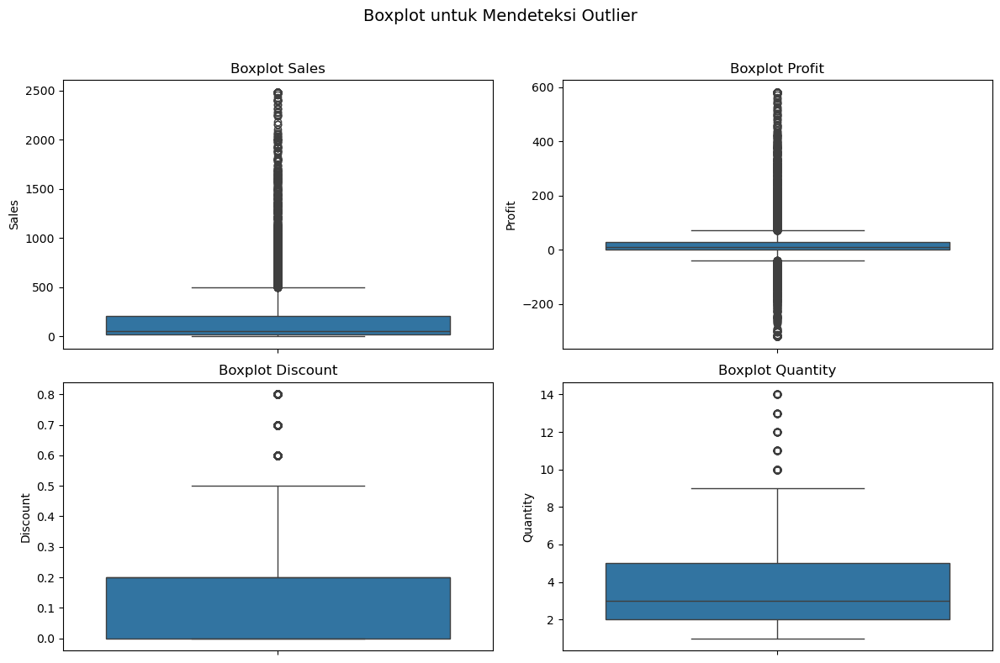

+----------+-------------+-------------+----------------+
|    Kolom | Lower Bound | Upper Bound | Jumlah Outlier |
+----------+-------------+-------------+----------------+
|    Sales |     -271.71 |      498.93 |           1167 |
|   Profit |    -39.7185 |     70.8135 |           1881 |
| Discount |        -0.3 |         0.5 |            856 |
| Quantity |        -2.5 |         9.5 |            170 |
+----------+-------------+-------------+----------------+


In [128]:
# Mendeteksi outlier dengan boxplot

numeric_columns = ["Sales", "Profit", "Discount", "Quantity"]

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle("Boxplot untuk Mendeteksi Outlier", fontsize=14)
for ax, col in zip(axes.flatten(), numeric_columns):
    sns.boxplot(y=df[col], ax=ax)
    ax.set_title(f"Boxplot {col}") 

plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.show()

# Mengecek Outlier dgn IQR

table = PrettyTable()
table.field_names = ["Kolom", "Lower Bound", "Upper Bound", "Jumlah Outlier"]

# Hitung IQR dan jumlah outlier
for col in numeric_columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_count = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()
    
    table.add_row([col, round(lower_bound, 4), round(upper_bound, 4), outlier_count])

table.align = "r"
print(table)

- Sales : Banyak Outlier Tinggi    
 Variabel "Sales" memiliki banyak outlier di sisi atas, mengindikasikan adanya transaksi penjualan dengan nilai yang sangat tinggi. Ini menunjukkan variasi yang ekstrem dalam nilai penjualan.

- Profit : Outlier di Kedua Sisi    
 Variabel "Profit" memiliki outlier di kedua sisi, menunjukkan adanya transaksi dengan keuntungan yang sangat tinggi dan juga kerugian yang signifikan.

- Discount : Sedikit Outlier Tinggi    
 Variabel "Discount" memiliki beberapa outlier di sisi atas, yang menunjukkan adanya transaksi dengan diskon tinggi. Namun, sebagian besar data terkonsentrasi di nilai diskon rendah atau nol.

- Quantity : Sedikit Outlier Tinggi   
 Variabel "Quantity" memiliki beberapa outlier di sisi atas, menandakan adanya transaksi dengan jumlah barang yang dibeli dalam jumlah besar. Namun, sebagian besar transaksi melibatkan kuantitas yang relatif kecil.

Kesimpulan :
- Outlier utama ada pada Sales dan Profit.
- Diskon yang tinggi dan rendah tidak menunjukkan anomali karena masih dalam range yang masuk akal. Selain itu, cukup banyak data dengan diskon tinggi diluar batas, menunjukkan mungkin memang ada kebijakan untuk diskon sebesar itu.
- Quantity tidak menunjukkan anomali, karena pemesanan dalam jumlah besar bisa terjadi dalam bisnis B2B.

Dengan demikian, hanya Sales dan Profit yang perlu dibersihkan dari data.

#### Membersihkan Data dengan Metode Winsorizing

Winsorizing adalah teknik statistik yang digunakan untuk mengurangi pengaruh outlier ekstrem dalam suatu data. Caranya bukan dengan menghapus outlier, tapi dengan mengganti nilai-nilai ekstrem (misalnya 1% terendah dan 1% tertinggi) dengan nilai pada batas persentil yang ditentukan.

Alasan menggunakan metode Winsorizing untuk membersihkan data anomali pada Sales dan Profit:

1. Menjaga Pola Data → Winsorizing mengganti outlier ekstrem tanpa menghapusnya, sehingga tren utama tetap terlihat.

2. Mencegah Distorsi Analisis → Penghapusan outlier dapat menyebabkan hilangnya informasi penting, terutama jika ada pola unik dalam data.

3. Cocok untuk Data dengan Outlier Ekstrem → Jika outlier berasal dari kesalahan input atau skenario yang jarang terjadi, winsorizing bisa menjadi solusi yang lebih stabil daripada trimming (menghapus data). Hal ini dilakukan karena tidak ada informasi yang cukup untuk membuktikan kevalidan data outliernya.

Alasan tidak menggunakan metode lain:
- Trimming (menghapus outlier) : mengurangi sampel dan menghilangkan informasi
- Log Transformation : tidak efektif untuk data dengan banyak nol dan negatif
- Robust Scalling : tidak menghilangkan outlier dan dapat mengubah distribusi data secara drastis.

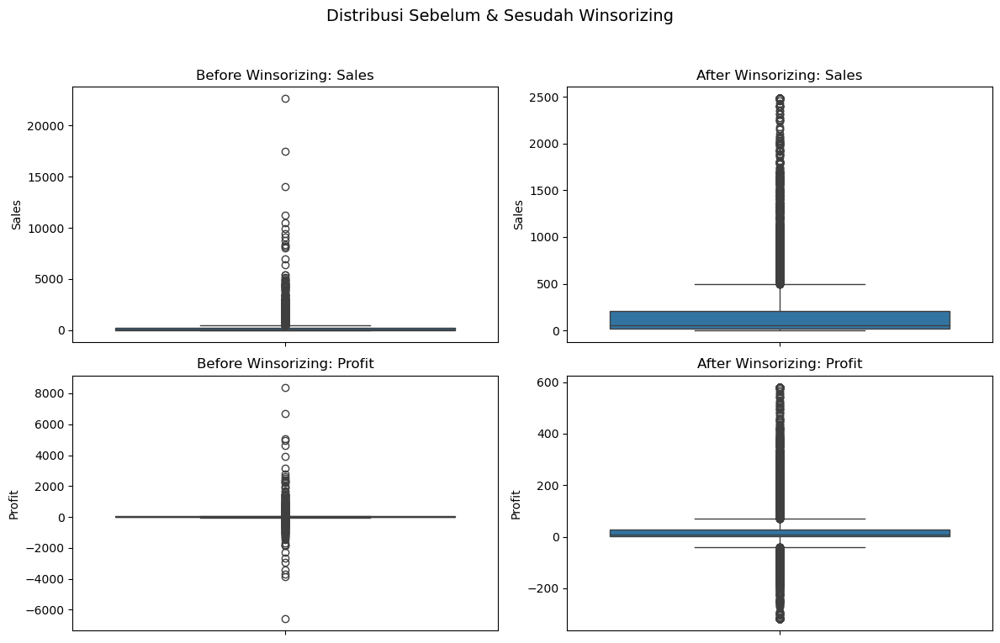

In [86]:
def apply_winsorizing(df, column, lower_percentile=0.01, upper_percentile=0.99):
    lower_limit = df[column].quantile(lower_percentile)
    upper_limit = df[column].quantile(upper_percentile)
    df[column] = np.where(df[column] < lower_limit, lower_limit, df[column])
    df[column] = np.where(df[column] > upper_limit, upper_limit, df[column])
    return df

columns_to_winsorize = ["Sales", "Profit"]

# Simpan salinan sebelum winsorizing untuk perbandingan
df_before = df.copy()

# Winsorizing
for col in columns_to_winsorize:
    df = apply_winsorizing(df, col)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle("Distribusi Sebelum & Sesudah Winsorizing", fontsize=14)

for i, col in enumerate(columns_to_winsorize):
    # Sebelum Winsorizing
    sns.boxplot(y=df_before[col], ax=axes[i, 0])
    axes[i, 0].set_title(f"Before Winsorizing: {col}")
    # Sesudah Winsorizing
    sns.boxplot(y=df[col], ax=axes[i, 1])
    axes[i, 1].set_title(f"After Winsorizing: {col}")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Outlier ekstrem dalam data Sales dan Profit telah digantikan dengan nilai yang lebih masuk akal dan dalam rentang yang wajar, tanpa menghapus data. Distribusi data menjadi lebih seimbang dan tidak terpengaruh oleh nilai ekstrem, tapi tetap mirip dengan distribusi data aslinya.

#### Kolom Tambahan

In [87]:
# Buat kolom baru untuk Tahun dan Bulan
df["Year"] = df["Order Date"].dt.year
df["Month"] = df["Order Date"].dt.month


# Tambahkan kolom margin
df["Margin"] = (df["Profit"] / df["Sales"]) * 100

#### Data Bersih

In [131]:
# Membulatkan semua kolom numerik ke 4 angka di belakang koma
df = df.apply(lambda x: np.round(x, 4) if np.issubdtype(x.dtype, np.number) else x)

Dengan demikian, dataset sudah selesai dibersihkan. Berikut sekilas informasi data terbaru.

In [132]:
listItem = []
for col in df.columns :
    listItem.append([col, df[col].dtype, df[col].isna().sum(),
                    df[col].nunique(), list(df[col].drop_duplicates().values)]);

dfDesc = pd.DataFrame(columns=['Columns', 'Data Type', 'Missing Value', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
print(df.shape)
dfDesc

(9993, 21)


,Columns,Data Type,Missing Value,Number of Unique,Unique Sample
0,Order ID,object,0,5009,"[EMEA-2022-152156, AMER-2022-138688, EMEA-2021-108966, AMER-2020-115812, EMEA-2023-114412, AMER-2022-161389, APJ-2021-118983, EMEA-2020-105893, EMEA-2020-167164, AMER-2020-143336, AMER-2022-137330, EMEA-2023-156909, EMEA-2021-106320, AMER-2022-121755, EMEA-2021-150630, APJ-2023-107727, APJ-2022-117590, APJ-2021-117415, APJ-2023-120999, AMER-2022-101343, EMEA-2023-139619, EMEA-2022-118255, AMER-2020-146703, APJ-2022-169194, APJ-2021-115742, EMEA-2022-105816, EMEA-2022-111682, AMER-2021-135545, APJ-2021-164175, AMER-2020-106376, EMEA-2022-119823, EMEA-2022-106075, AMER-2023-114440, EMEA-2021-134026, APJ-2023-118038, APJ-2020-147606, EMEA-2022-127208, AMER-2020-139451, EMEA-2021-149734, APJ-2023-119662, AMER-2023-140088, EMEA-2023-155558, APJ-2022-159695, AMER-2022-109806, EMEA-2021-149587, EMEA-2023-109484, EMEA-2023-161018, AMER-2023-157833, EMEA-2022-149223, APJ-2022-158568, EMEA-2022-129903, EMEA-2021-156867, EMEA-2023-119004, APJ-2021-129476, EMEA-2023-146780, EMEA-2022-128867, AMER-2020-115259, AMER-2021-110457, EMEA-2021-136476, APJ-2022-103730, APJ-2020-152030, APJ-2020-134614, AMER-2023-107272, AMER-2022-125969, AMER-2023-164147, AMER-2022-145583, EMEA-2022-110366, AMER-2023-106180, EMEA-2023-155376, AMER-2021-110744, AMER-2020-110072, EMEA-2022-114489, AMER-2022-158834, AMER-2021-124919, AMER-2021-118948, AMER-2020-104269, APJ-2022-114104, AMER-2022-162733, EMEA-2021-119697, APJ-2022-154508, AMER-2022-113817, APJ-2020-139892, AMER-2020-118962, APJ-2020-100853, APJ-2023-152366, AMER-2021-101511, EMEA-2021-137225, APJ-2020-166191, EMEA-2020-158274, EMEA-2022-105018, AMER-2020-123260, APJ-2022-157000, EMEA-2021-102281, AMER-2021-131457, AMER-2020-140004, AMER-2023-107720, EMEA-2023-124303, AMER-2023-105074, EMEA-2020-133690, APJ-2023-116701, ...]"
1,Order Date,datetime64[ns],0,1237,"[2022-11-09T00:00:00.000000000, 2022-06-13T00:00:00.000000000, 2021-10-11T00:00:00.000000000, 2020-06-09T00:00:00.000000000, 2023-04-16T00:00:00.000000000, 2022-12-06T00:00:00.000000000, 2021-11-22T00:00:00.000000000, 2020-11-11T00:00:00.000000000, 2020-05-13T00:00:00.000000000, 2020-08-27T00:00:00.000000000, 2022-12-10T00:00:00.000000000, 2023-07-17T00:00:00.000000000, 2021-09-25T00:00:00.000000000, 2022-01-16T00:00:00.000000000, 2021-09-17T00:00:00.000000000, 2023-10-20T00:00:00.000000000, 2022-12-09T00:00:00.000000000, 2021-12-27T00:00:00.000000000, 2023-09-11T00:00:00.000000000, 2022-07-18T00:00:00.000000000, 2023-09-20T00:00:00.000000000, 2022-03-12T00:00:00.000000000, 2020-10-20T00:00:00.000000000, 2022-06-21T00:00:00.000000000, 2021-04-18T00:00:00.000000000, 2022-12-12T00:00:00.000000000, 2022-06-18T00:00:00.000000000, 2021-11-24T00:00:00.000000000, 2021-04-30T00:00:00.000000000, 2020-12-05T00:00:00.000000000, 2022-06-05T00:00:00.000000000, 2022-09-19T00:00:00.000000000, 2023-09-15T00:00:00.000000000, 2021-04-26T00:00:00.000000000, 2023-12-10T00:00:00.000000000, 2020-11-26T00:00:00.000000000, 2020-10-12T00:00:00.000000000, 2021-09-03T00:00:00.000000000, 2023-11-14T00:00:00.000000000, 2023-05-29T00:00:00.000000000, 2023-10-27T00:00:00.000000000, 2022-04-06T00:00:00.000000000, 2022-09-18T00:00:00.000000000, 2021-01-31T00:00:00.000000000, 2023-11-07T00:00:00.000000000, 2023-11-10T00:00:00.000000000, 2023-06-18T00:00:00.000000000, 2022-09-07T00:00:00.000000000, 2022-08-30T00:00:00.000000000, 2022-12-02T00:00:00.000000000, 2021-11-13T00:00:00.000000000, 2023-11-24T00:00:00.000000000, 2021-10-15T00:00:00.000000000, 2023-12-26T00:00:00.000000000, 2022-11-04T00:00:00.000000000, 2020-08-25T00:00:00.000000000, 2021-03-02T00:00:00.000000000, 2021-04-05T00:00:00.000000000, 2020-12-26T00:00:00.000000000, 2020-09-20T00:00:00.000000000, 2023-11-06T00:00:00.000000000, 2022-11-07T00:00:00.000000000, 2023-02-03T00:00:00.000000000, 2022-10-14T00:00:00.000000000, 2022-09-06T00:00:00.000000000, 2023-09-19T00:00:00.000000000, 2023-12-23T00:00:00.000000000, 2021-09-07T00:

#### Menampilkan Ringkasan Statistik

In [133]:
display(df.describe(), df.describe(include='object'))

# df.describe() menghasilkan ringkasan statistik dari kolom numerik
# df.describe(include='object') menghasilkan ringkasan statistik dari kolom non-numerik (data kategoris dan teks)

,Order Date,Sales,Quantity,Discount,Profit,Year,Month,Margin
count,9993,9993.000000,9993.000000,9993.000000,9993.000000,9993.000000,9993.000000,9993.000000
mean,2022-05-01 01:53:33.089162240,209.360782,3.789753,0.156188,26.310936,2021.723106,7.815271,12.620254
min,2020-01-04 00:00:00,2.286000,1.000000,0.000000,-319.275400,2020.000000,1.000000,-275.000000
25%,2021-05-23 00:00:00,17.280000,2.000000,0.000000,1.731000,2021.000000,5.000000,7.500000
50%,2022-06-27 00:00:00,54.480000,3.000000,0.200000,8.671000,2022.000000,9.000000,27.000000
75%,2023-05-15 00:00:00,209.940000,5.000000,0.200000,29.364000,2023.000000,11.000000,36.250000
max,2023-12-31 00:00:00,2481.942400,14.000000,0.800000,580.674800,2023.000000,12.000000,50.000000
std,NaN,394.829273,2.225149,0.206457,97.570315,1.123964,3.285504,44.686298


,Order ID,Contact Name,Country,City,Region,Subregion,Customer,Customer ID,Industry,Segment,Product,Profit_Category,Profit Category
count,9993,9993,9993,9993,9993,9993,9993,9993,9993,9993,9993,9993,9993
unique,5009,793,48,262,3,12,99,99,10,3,14,2,2
top,EMEA-2023-100111,Leonard Kelly,United States,London,EMEA,NAMER,Allianz,1080,Finance,SMB,ContactMatcher,Positive Profit,Positive Profit
freq,14,37,2001,922,4219,2507,192,192,2126,5191,1842,8058,8058


## Data Analysis

### **Analisis Penjualan & Keuntungan**

#### 1. Tren Penjualan & Profit Berdasarkan Waktu
- Bagaimana pola penjualan dan profit setiap bulan dari tahun ke tahun?
- Apakah terdapat periode waktu tertentu yang secara konsisten menunjukkan performa tinggi atau rendah?

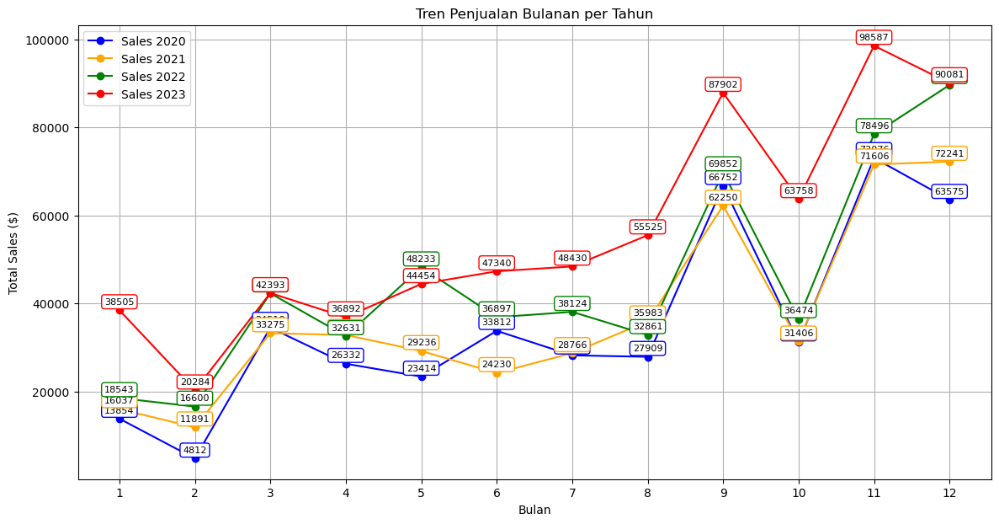

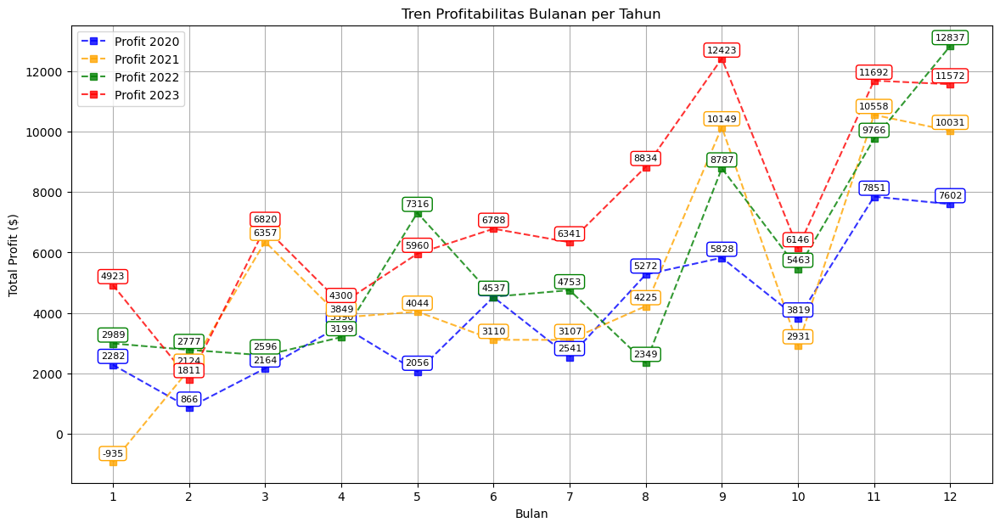

In [136]:
# Agregasi data per bulan dan tahun
monthly_trend = df.groupby(["Year", "Month"])[["Sales", "Profit"]].sum().reset_index()

colors = ["blue", "orange", "green", "red"]

# Plot Sales per Bulan untuk Setiap Tahun
plt.figure(figsize=(14, 7))
for idx, year in enumerate(monthly_trend["Year"].unique()):
    subset = monthly_trend[monthly_trend["Year"] == year]
    color = colors[idx % len(colors)]
    
    plt.plot(subset["Month"], subset["Sales"], marker="o", linestyle="-", color=color, label=f"Sales {year}")

    for i, txt in enumerate(subset["Sales"]):
        plt.annotate(f"{txt:.0f}", 
                     (subset["Month"].iloc[i], subset["Sales"].iloc[i]),
                     textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8,
                     bbox=dict(boxstyle="round,pad=0.3", edgecolor=color, facecolor="white"))

plt.title("Tren Penjualan Bulanan per Tahun")
plt.xlabel("Bulan")
plt.ylabel("Total Sales ($)")
plt.xticks(range(1, 13))
plt.legend()
plt.grid(True)
plt.show()

# Plot Profit per Bulan untuk Setiap Tahun
plt.figure(figsize=(14, 7))
for idx, year in enumerate(monthly_trend["Year"].unique()):
    subset = monthly_trend[monthly_trend["Year"] == year]
    color = colors[idx % len(colors)] 
    
    plt.plot(subset["Month"], subset["Profit"], marker="s", linestyle="--", color=color, alpha=0.8, label=f"Profit {year}")

    for i, txt in enumerate(subset["Profit"]):
        plt.annotate(f"{txt:.0f}", 
                     (subset["Month"].iloc[i], subset["Profit"].iloc[i]),
                     textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8,
                     bbox=dict(boxstyle="round,pad=0.3", edgecolor=color, facecolor="white"))

plt.title("Tren Profitabilitas Bulanan per Tahun")
plt.xlabel("Bulan")
plt.ylabel("Total Profit ($)")
plt.xticks(range(1, 13))
plt.legend()
plt.grid(True)
plt.show()

Kesimpulan Tren Penjualan Bulanan per Tahun : 
- **Pola Sales dan Profit:**
  - Penjualan dan profit cenderung rendah di awal tahun (Januari dan Februari).
  - Terjadi **peningkatan yang signifikan mulai bulan Maret atau April**, dengan fluktuasi di beberapa bulan berikutnya.
  - Puncak penjualan tertinggi seringnya terjadi di **bulan November**, kecuali **pada tahun 2021 dan 2022, puncaknya ada di bulan Desember**.
  - Namun, profit tertinggi di secara keseluruhan justru ada di **bulan Desember 2022**.
  - Meskipun menurun sedikit, **Desember** tetap memiliki performa lebih baik dibanding awal tahun.
  - Baik penjualan maupun profit, **bulan Oktober selalu mencatat performa yang sangat buruk** dibandingkan bulan sebelum dan sesudahnya di setiap tahun.

- **Musim dengan Performa Tertinggi dan Terendah:**
  - **November** konsisten menjadi periode dengan penjualan dan profit terbaik di rata-rata tahun.
  - Oktober secara relatif menunjukkan performa yang lebih rendah dibandingkan bulan-bulan kuartal keempat lainnya, namun **awal tahun** cenderung lebih sering berpotensi performa rendah.
  - Peningkatan paling mencolok terjadi di tahun **2023**, mengindikasikan potensi pertumbuhan tahunan.

- **Perbandingan Antar Tahun:**
  - **Tahun 2023** menunjukkan lonjakan performa lebih agresif dibanding tahun-tahun sebelumnya.
  - **Tahun 2020** memiliki performa yang relatif lebih rendah dan fluktuatif, kemungkinan akibat dampak pandemi.
  - Terdapat tren **pertumbuhan positif dari tahun ke tahun**, mencerminkan peningkatan performa bisnis secara keseluruhan.

#### 2. Performa Penjualan Berdasarkan Negara
- Negara mana yang memberikan kontribusi terbesar terhadap penjualan dan keuntungan?
- Apakah ada negara dengan penjualan tinggi tetapi margin rendah?

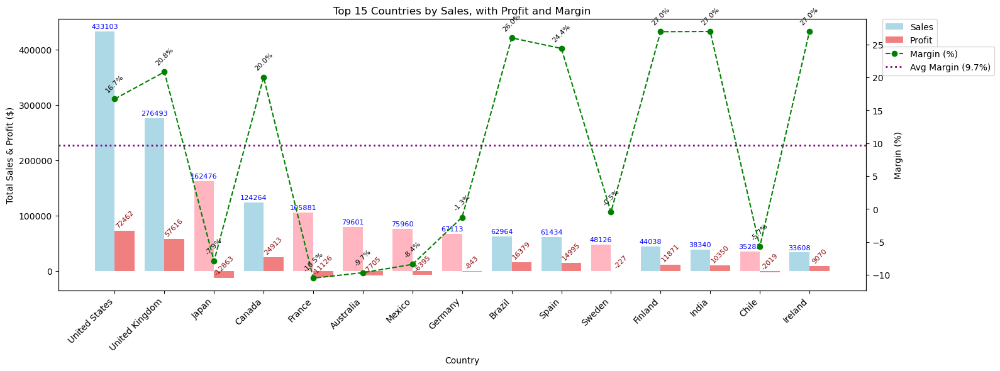

In [137]:
top_countries = df.groupby("Country")[["Sales", "Profit"]].sum()
top_countries["Margin"] = (top_countries["Profit"] / top_countries["Sales"]) * 100
top_countries = top_countries.sort_values(by="Sales", ascending=False).head(15).reset_index() # 15 negara dengan sales tertinggi

x = np.arange(len(top_countries))
bar_width = 0.4
fig, ax1 = plt.subplots(figsize=(16, 6))

margin_color = ['lightpink' if m < 10 else 'lightblue' for m in top_countries["Margin"]]

# Bar chart untuk Sales & Profit
bars1 = ax1.bar(x - bar_width/2, top_countries["Sales"], bar_width, label="Sales", color=margin_color)
bars2 = ax1.bar(x + bar_width/2, top_countries["Profit"], bar_width, label="Profit", color="lightcoral")
ax1.set_ylabel("Total Sales & Profit ($)")
ax1.set_xlabel("Country")
ax1.set_xticks(x)
ax1.set_xticklabels(top_countries["Country"], rotation=45, ha="right")

# Sumbu kedua untuk Margin
ax2 = ax1.twinx()
ax2.plot(x, top_countries["Margin"], color="green", marker='o', linestyle='--', label="Margin (%)")
ax2.set_ylabel("Margin (%)")

# Anotasi
for i in range(len(top_countries)):
    ax1.annotate(f'{int(top_countries["Sales"].iloc[i])}', (x[i] - bar_width/2, top_countries["Sales"].iloc[i] + 5000),
                 ha='center', fontsize=8, color='blue')
    ax1.annotate(f'{int(top_countries["Profit"].iloc[i])}', (x[i] + bar_width/2, top_countries["Profit"].iloc[i] + 5000),
                 ha='center', fontsize=8, color='darkred', rotation=45)
    ax2.annotate(f'{top_countries["Margin"].iloc[i]:.1f}%', (x[i], top_countries["Margin"].iloc[i] + 1),
                 ha='center', fontsize=8, color='black', rotation=45)

# Garis margin rata-rata
avg_margin = top_countries["Margin"].mean()
ax2.axhline(avg_margin, color="purple", linestyle="dotted", linewidth=2, label=f"Avg Margin ({avg_margin:.1f}%)")

ax1.set_title("Top 15 Countries by Sales, with Profit and Margin")
ax1.legend(loc='upper left', bbox_to_anchor=(1.02, 1), borderaxespad=0)
ax2.legend(loc='upper left', bbox_to_anchor=(1.02, 0.9), borderaxespad=0)

plt.tight_layout()
plt.show()

Kesimpulan Performa Penjualan Berdasarkan Negara :
- **United States** memberikan kontribusi terbesar terhadap total penjualan dan keuntungan, dengan margin yang sehat. Hal ini menjadikannya pasar yang paling stabil dan menguntungkan secara keseluruhan.

- **United Kingdom** dan **Canada** juga menunjukkan performa yang baik, dengan profit besar dan margin positif, meskipun total penjualannya tidak sebesar US.

- Negara seperti **Japan**, **France**, dan **Australia** memiliki tingkat penjualan yang tinggi, namun margin negatif. Ini mengindikasikan potensi inefisiensi, seperti struktur harga yang kurang optimal, biaya operasional tinggi, atau penggunaan diskon yang terlalu agresif.

- Negara dengan kontribusi rendah seperti **Sweden** dan **Chile** menunjukkan penjualan dan profit yang relatif kecil terhadap total global.

- Sebaliknya, negara seperti **Finland**, **India** dan **Ireland** menunjukkan margin yang sangat tinggi meskipun volumenya kecil. Ini menandakan efisiensi operasional dan strategi harga yang baik, dan dapat menjadi target ekspansi potensial.


#### 3. Profitabilitas dan Efisiensi per Industri
- Industri mana yang memberikan kontribusi penjualan (sales) terbesar?
- Industri mana yang paling menguntungkan bagi perusahaan?
- Apakah industri dengan penjualan tinggi juga memberikan profit tinggi?

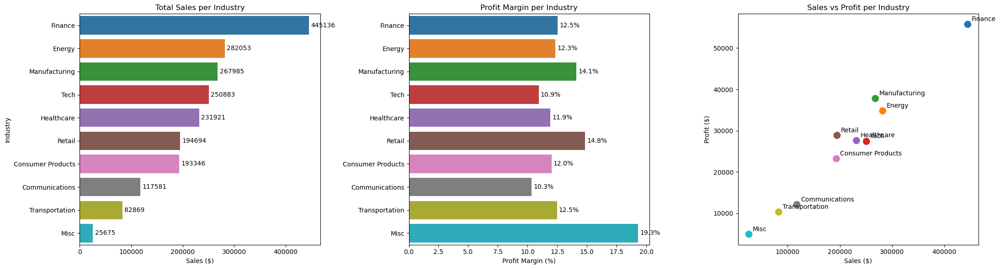

In [138]:
industry_stats = df.groupby("Industry").agg({
    "Sales": "sum",
    "Profit": "sum",
    "Quantity": "sum"
}).reset_index()

industry_stats["Profit Margin (%)"] = (industry_stats["Profit"] / industry_stats["Sales"]) * 100
industry_stats = industry_stats.sort_values(by="Sales", ascending=False)

palette = sns.color_palette("tab10", len(industry_stats))
color_map = dict(zip(industry_stats["Industry"], palette))

fig, axes = plt.subplots(1, 3, figsize=(22, 6))

# Barplot Total Sales per Industry
bar1 = sns.barplot(data=industry_stats, y="Industry", x="Sales", ax=axes[0],
                   palette=[color_map[i] for i in industry_stats["Industry"]])
axes[0].set_title("Total Sales per Industry")
axes[0].set_xlabel("Sales ($)")
axes[0].set_ylabel("Industry")
for container in bar1.containers:
    axes[0].bar_label(container, fmt='%.0f', label_type='edge', padding=3)

# Barplot Profit Margin per Industry
bar2 = sns.barplot(data=industry_stats, y="Industry", x="Profit Margin (%)", ax=axes[1],
                   palette=[color_map[i] for i in industry_stats["Industry"]])
axes[1].set_title("Profit Margin per Industry")
axes[1].set_xlabel("Profit Margin (%)")
axes[1].set_ylabel(None)
for container in bar2.containers:
    axes[1].bar_label(container, fmt='%.1f%%', label_type='edge', padding=3)

# Scatterplot Sales vs Profit per Industry
sns.scatterplot(data=industry_stats, x="Sales", y="Profit", hue="Industry",
                palette=color_map, s=150, ax=axes[2], legend=False)
axes[2].set_title("Sales vs Profit per Industry")
axes[2].set_xlabel("Sales ($)")
axes[2].set_ylabel("Profit ($)")

# Anotasi scatterplot
for _, row in industry_stats.iterrows():
    axes[2].annotate(row["Industry"], (row["Sales"], row["Profit"]),
                     textcoords="offset points", xytext=(6, 5), ha='left')

plt.tight_layout()
plt.show()

Kesimpulan Profitabilitas dan Efisiensi per Industri :
- **Industri dengan Penjualan Terbesar**
   - **Finance** menempati posisi teratas dengan total penjualan sebesar **$445K**, diikuti oleh **Energy** ($282K) dan **Manufacturing** ($268K).
   - Industri-industri ini memberikan kontribusi besar terhadap pendapatan perusahaan, mencerminkan pentingnya penjualan dalam mendorong total revenue perusahaan.
- **Industri dengan Profit Margin Tertinggi**
   - **Misc** memiliki profit margin tertinggi **(19.30%)**, namun **penjualan dan quantity rendah**.
   - **Retail** dan **Manufacturing** menunjukkan **profit margin tinggi** (14.83% dan 14.10%) dibandingkan dengan **Finance** yang hanya memiliki **12.52%**.
   - **Retail** menjadi industri yang sangat efisien dengan **margin tinggi** dan **penjualan cukup signifikan**.
   - Meskipun **Finance** memiliki penjualan terbesar, profit margin-nya lebih rendah dibandingkan dengan **Retail** dan **Manufacturing**, yang menunjukkan adanya ketidakseimbangan antara **penjualan** dan **profitabilitas**.
   - **Tech** dan **Communications** memiliki profit margin paling rendah (**10.93% dan 10.33%**) meskipun penjualannya cukup besar, menunjukkan bahwa keuntungan mereka **tidak optimal**.
- **Perbandingan antara Penjualan dan Keuntungan per Industri**
   - Penjualan tinggi umumnya berkorelasi dengan profit tinggi. Namun, profitabilitas bervariasi antar industri; **penjualan tinggi tidak selalu menjamin profit tertinggi**.

#### 4. Segmentasi Produk & Profitabilitas
- Produk mana yang menjadi kontributor utama terhadap sales dan profit?
- Produk apa yang memiliki volume penjualan tinggi namun margin rendah?

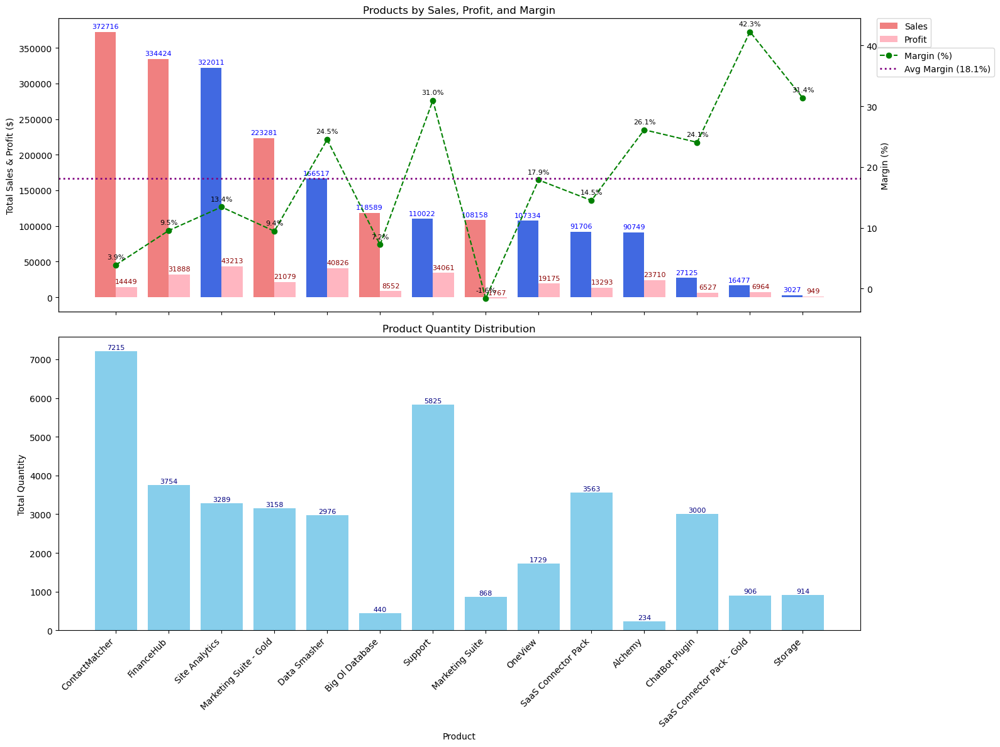

In [139]:
product_stats = df.groupby("Product").agg({"Sales": "sum", "Profit": "sum", "Quantity": "sum"}).reset_index()
product_stats["Margin"] = (product_stats["Profit"] / product_stats["Sales"]) * 100
top_products = product_stats.sort_values(by="Sales", ascending=False)

x = np.arange(len(top_products))
bar_width = 0.4

fig, (ax1, ax3) = plt.subplots(2, 1, figsize=(16, 12), sharex=True)

# Subplot 1: Sales, Profit, dan Margin
# Bar chart untuk Sales & Profit
margin_color = ['lightcoral' if m < 10 else 'royalblue' for m in top_products["Margin"]]
bars1 = ax1.bar(x - bar_width/2, top_products["Sales"], bar_width, label="Sales", color=margin_color)
bars2 = ax1.bar(x + bar_width/2, top_products["Profit"], bar_width, label="Profit", color="lightpink")
ax1.set_ylabel("Total Sales & Profit ($)")
ax1.set_title("Products by Sales, Profit, and Margin")

# Sumbu kedua untuk Margin
ax1b = ax1.twinx()
ax1b.plot(x, top_products["Margin"], color="green", marker='o', linestyle='--', label="Margin (%)")
ax1b.set_ylabel("Margin (%)")

# Anotasi
for i in range(len(top_products)):
    ax1.annotate(f'{int(top_products["Sales"].iloc[i])}', 
                 (x[i] - bar_width/2, top_products["Sales"].iloc[i] + 5000),
                 ha='center', fontsize=8, color='blue')
    ax1.annotate(f'{int(top_products["Profit"].iloc[i])}', 
                 (x[i] + bar_width/2, top_products["Profit"].iloc[i] + 5000),
                 ha='center', fontsize=8, color='darkred')
    ax1b.annotate(f'{top_products["Margin"].iloc[i]:.1f}%', 
                  (x[i], top_products["Margin"].iloc[i] + 1),
                  ha='center', fontsize=8, color='black')

# Rata-rata Margin
avg_margin = top_products["Margin"].mean()
ax1b.axhline(avg_margin, color="purple", linestyle="dotted", linewidth=2, label=f"Avg Margin ({avg_margin:.1f}%)")

ax1.legend(loc='upper left', bbox_to_anchor=(1.02, 1), borderaxespad=0)
ax1b.legend(loc='upper left', bbox_to_anchor=(1.02, 0.9), borderaxespad=0)

# Subplot 2: Quantity per Product
ax3.bar(x, top_products["Quantity"], color='skyblue')
ax3.set_ylabel("Total Quantity")
ax3.set_xlabel("Product")
ax3.set_title("Product Quantity Distribution")
ax3.set_xticks(x)
ax3.set_xticklabels(top_products["Product"], rotation=45, ha="right")

# Anotasi
for i in range(len(top_products)):
    ax3.annotate(f'{int(top_products["Quantity"].iloc[i])}', 
                 (x[i], top_products["Quantity"].iloc[i] + 50),
                 ha='center', fontsize=8, color='navy')

plt.tight_layout()
plt.show()

Kesimpulan Segmentasi Produk & Profitabilitas :
- **Produk dengan kontribusi terbesar terhadap sales dan profit**:
    - Produk seperti **ContactMatcher**, **FinanceHub**, dan **Site Analytics** memiliki total penjualan tertinggi.
    - Namun, **Site Analytics** memiliki profit lebih tinggi dibandingkan **ContactMatcher** dan **FinanceHub**, dan menunjukkan **margin keuntungan** yang lebih baik.

- **Produk dengan penjualan tinggi namun margin rendah**:
    - **ContactMatcher** memiliki total penjualan tertinggi, namun margin keuntungan sangat rendah (**3.9%**).
    - **FinanceHub** dan **Marketing Suite - Gold** juga menunjukkan **penjualan tinggi** tetapi dengan margin yang tidak terlalu besar (**9.5%** dan **9.4%**).
    - Hal ini mengindikasikan bahwa meskipun produk ini sering terjual, **profitabilitas** mereka lebih rendah dibandingkan produk lain.

- **Produk dengan profitabilitas tinggi (margin tinggi)**:
    - Produk seperti **SaaS Connector Pack - Gold (42.3%)**, **Support (31.0%)**, dan **Storage (31.4%)** menunjukkan **margin yang lebih tinggi** meskipun penjualannya tidak sebesar produk lain.
    - Produk-produk ini memiliki **efisiensi keuntungan** yang lebih baik, sehingga **profit tetap optimal meskipun quantity dan sales lebih kecil**.

- **Produk yang mengalami kerugian**:
    - **Marketing Suite** menunjukkan **kerugian (margin negatif)** meskipun memiliki volume penjualan yang cukup besar. Ini bisa disebabkan oleh **biaya operasional yang lebih tinggi** atau **strategi harga** yang tidak efektif.


### **Analisis Diskon & Profitabilitas**

#### 1. Pengaruh Diskon terhadap Profit
- Apakah diskon tinggi berbanding lurus dengan profit rendah?
- Apakah transaksi dengan profit tinggi cenderung diberi diskon kecil?

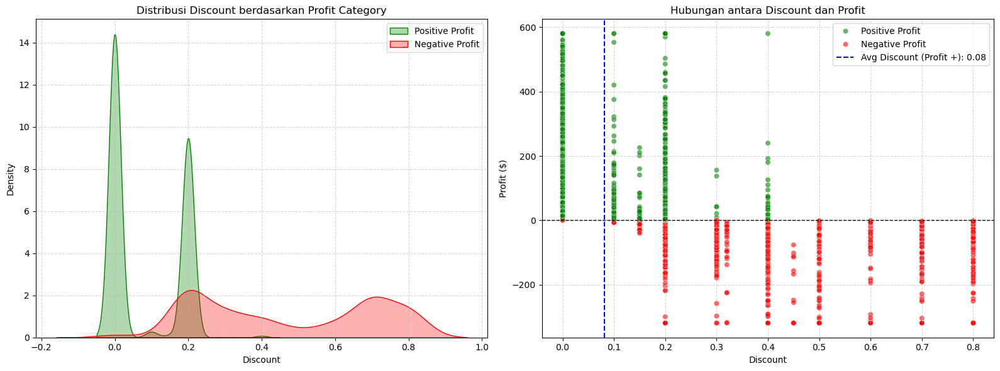

In [140]:
df["Profit Category"] = df["Profit"].apply(lambda x: "Positive Profit" if x > 0 else "Negative Profit")
avg_discount_positive = df[df["Profit"] > 0]["Discount"].mean()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Histogram Distribusi Diskon
sns.kdeplot(
    data=df[df['Profit Category'] == 'Positive Profit'], 
    x='Discount', label='Positive Profit', color='green', fill=True, alpha=0.3, ax=ax1)
sns.kdeplot(
    data=df[df['Profit Category'] == 'Negative Profit'], 
    x='Discount', label='Negative Profit', color='red', fill=True, alpha=0.3, ax=ax1)
ax1.set_title('Distribusi Discount berdasarkan Profit Category')
ax1.set_xlabel('Discount')
ax1.set_ylabel('Density')
ax1.legend()
ax1.grid(True, linestyle='--', alpha=0.5)

# Scatter Plot - Hubungan Diskon dan Profit
sns.scatterplot(
    data=df, x='Discount', y='Profit', hue='Profit Category',
    palette={'Positive Profit': 'green', 'Negative Profit': 'red'},
    alpha=0.6, ax=ax2)
ax2.axhline(0, color='black', linestyle='--', linewidth=1)
ax2.axvline(avg_discount_positive, color='blue', linestyle='--', label=f"Avg Discount (Profit +): {avg_discount_positive:.2f}")
ax2.set_title('Hubungan antara Discount dan Profit')
ax2.set_xlabel('Discount')
ax2.set_ylabel('Profit ($)')
ax2.legend()
ax2.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

In [141]:
avg_discount_positive = df[df["Profit"] > 0]["Discount"].mean()
discount_by_profit_category = df.groupby("Profit Category")["Discount"].describe()
correlation_discount_profit = df["Discount"].corr(df["Profit"])

print("Rata-rata Diskon untuk Transaksi dengan Profit Positif:", avg_discount_positive)
print("\nDistribusi Diskon berdasarkan Kategori Profit:")
print(discount_by_profit_category)

corr, p_value = pearsonr(df["Discount"], df["Profit"])
print(f"\nKorelasi Diskon vs Profit: {corr:.2f}, p-value: {p_value:.4f}")

Rata-rata Diskon untuk Transaksi dengan Profit Positif: 0.08104368329610324

Distribusi Diskon berdasarkan Kategori Profit:
                  count      mean       std  min  25%  50%  75%  max
Profit Category                                                     
Negative Profit  1935.0  0.469116  0.240797  0.0  0.2  0.4  0.7  0.8
Positive Profit  8058.0  0.081044  0.098884  0.0  0.0  0.0  0.2  0.4

Korelasi Diskon vs Profit: -0.35, p-value: 0.0000


Kesimpulan Pengaruh Diskon terhadap Profitabilitas :
- **Diskon Tinggi Berbanding Lurus dengan Profit Rendah**:
   - Berdasarkan **boxplot**, kategori **Negative Profit** (profit negatif) menunjukkan distribusi diskon yang jauh lebih tinggi dibandingkan kategori **Positive Profit**. Median diskon untuk transaksi dengan profit negatif sekitar 40%, sedangkan untuk transaksi dengan profit positif, median diskon berada pada kisaran 0-10%. Ini menunjukkan bahwa semakin besar diskon, semakin besar kemungkinan profit menjadi negatif.
- **Diskon Kecil Cenderung Diberikan pada Transaksi dengan Profit Positif**:
   - **Rata-rata Diskon**: Rata-rata diskon untuk transaksi dengan profit positif adalah **8.1%**, yang jauh lebih rendah dibandingkan dengan transaksi dengan profit negatif (rata-rata diskon sekitar 47%). Ini mengindikasikan bahwa **transaksi dengan profit positif cenderung diberi diskon yang lebih rendah**.
- **Korelasi Negatif antara Diskon dan Profit**:
   - Ditemukan **korelasi negatif** sebesar **-0.35** antara diskon dan profit. Ini menunjukkan hubungan yang cukup kuat antara pemberian diskon tinggi dan menurunnya profitabilitas, sehingga strategi pemberian diskon tinggi dapat mengurangi keuntungan perusahaan.
- **Risiko Diskon Tinggi**:
   - Pada scatter plot, banyak transaksi dengan profit negatif terlihat pada diskon di atas **20-30%**, sementara transaksi dengan diskon di bawah **10%** cenderung memberikan profit positif. Ini mengindikasikan bahwa diskon yang terlalu tinggi berisiko besar mengurangi profit.
   - Transaksi dengan **diskon lebih dari 40% selalu menghasilkan profit negatif**.

#### 2. Distribusi Diskon
- Produk mana yang paling sering mendapat diskon?
- Apakah diskon efektif meningkatkan volume penjualan?

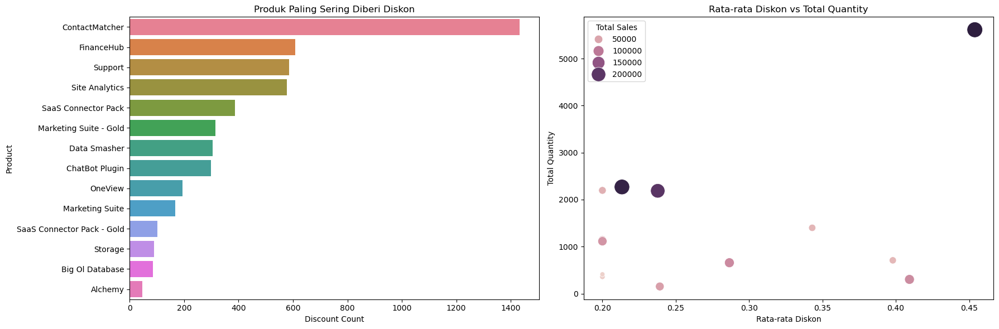

In [142]:
product_discount_stats = df[df["Discount"] > 0].groupby("Product").agg({"Discount": ["count", "mean"],
                                                                        "Sales": "sum",
                                                                        "Quantity": "sum"
                                                                        }).reset_index()
product_discount_stats.columns = ["Product", "Discount Count", "Average Discount", "Total Sales", "Total Quantity"]

top_discounted_products = product_discount_stats.sort_values(by="Discount Count", ascending=False)
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Produk dengan frekuensi diskon terbanyak
sns.barplot(data=top_discounted_products, y="Product", x="Discount Count", hue="Product", ax=axes[0])
axes[0].set_title("Produk Paling Sering Diberi Diskon")
axes[0].set_xlabel("Discount Count")
axes[0].set_ylabel("Product")

# Korelasi rata-rata diskon vs kuantitas
sns.scatterplot(data=product_discount_stats, x="Average Discount", y="Total Quantity", 
                size="Total Sales", hue="Total Sales", sizes=(40, 400), ax=axes[1])
axes[1].set_title("Rata-rata Diskon vs Total Quantity")
axes[1].set_xlabel("Rata-rata Diskon")
axes[1].set_ylabel("Total Quantity")

plt.tight_layout()
plt.show()

Kesimpulan Distribusi Diskon :
- **Produk yang Paling Sering Mendapat Diskon**:
   - **ContactMatcher** adalah produk yang paling sering diberi diskon, jauh lebih banyak dibandingkan produk lainnya. Produk seperti **FinanceHub**, **Support**, dan **Site Analytics** juga sering mendapat diskon, meskipun frekuensinya lebih rendah dibandingkan dengan **ContactMatcher**. Hal ini menunjukkan bahwa perusahaan mungkin mengandalkan diskon sebagai strategi untuk meningkatkan penjualan produk-produk ini.

- **Pengaruh Diskon terhadap Volume Penjualan**:
   - Meskipun ada beberapa produk dengan diskon tinggi (>30%), diskon tersebut tidak selalu menghasilkan volume penjualan yang signifikan. Sebaliknya, produk dengan diskon lebih rendah (~20%) menunjukkan **volume penjualan yang lebih stabil**.
   - Beberapa titik pada scatter plot menunjukkan bahwa diskon yang lebih tinggi dapat meningkatkan volume penjualan, namun peningkatan tersebut tidak selalu konsisten. Ini mengindikasikan bahwa meskipun diskon bisa meningkatkan penjualan, **efektivitas diskon sangat tergantung pada tingkat diskon dan produk yang dijual**.

### **Analisis Kuantitas & Revenue**

#### 1. Hubungan Quantity dengan Sales dan Profit
- Apakah produk yang paling banyak terjual juga yang menghasilkan revenue tertinggi?
- Apakah quantity yang tinggi selalu berarti profit tinggi?

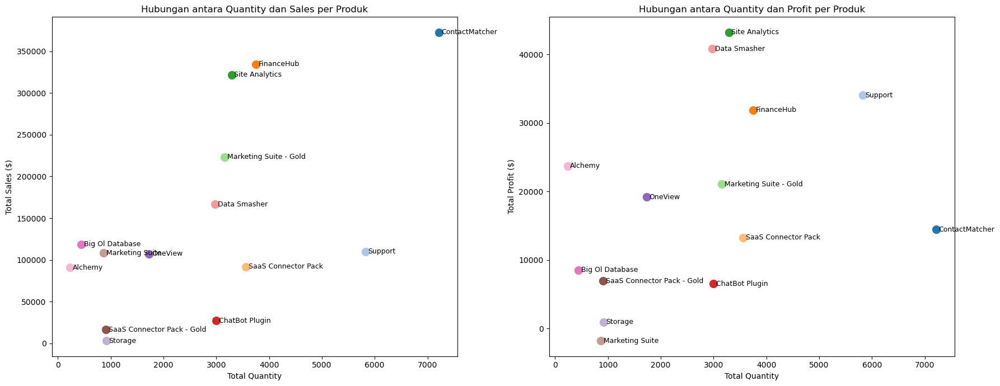

In [143]:
product_summary = df.groupby('Product').agg({'Sales': 'sum', 'Quantity': 'sum', 'Profit': 'sum'}).reset_index()
product_summary = product_summary.sort_values(by='Quantity', ascending=False)

colors = sns.color_palette("tab20", len(product_summary))
color_map = dict(zip(product_summary['Product'], colors))

fig, axs = plt.subplots(1, 2, figsize=(18, 7))

# Scatter Plot Hubungan Quantity dan Sales
for _, row in product_summary.iterrows():
    axs[0].scatter(row['Quantity'], row['Sales'],
                   color=color_map[row['Product']], s=100)
    axs[0].text(row['Quantity'] + 50, row['Sales'], row['Product'], 
                fontsize=9, verticalalignment='center')

axs[0].set_title('Hubungan antara Quantity dan Sales per Produk')
axs[0].set_xlabel('Total Quantity')
axs[0].set_ylabel('Total Sales ($)')

# Scatter Plot Hubungan Quantity dan Profit
for _, row in product_summary.iterrows():
    axs[1].scatter(row['Quantity'], row['Profit'],
                   color=color_map[row['Product']], s=100)
    axs[1].text(row['Quantity'] + 50, row['Profit'], row['Product'], 
                fontsize=9, verticalalignment='center')

axs[1].set_title('Hubungan antara Quantity dan Profit per Produk')
axs[1].set_xlabel('Total Quantity')
axs[1].set_ylabel('Total Profit ($)')

plt.tight_layout()
plt.show()

Kesimpulan Hubungan Quantity dengan Sales dan Profit :
- Hubungan Quantity vs Sales
    - Terdapat **hubungan positif** antara jumlah produk terjual (**Quantity**) dan total penjualan (**Sales**).
    - Produk dengan quantity tinggi umumnya memiliki sales tinggi, namun **tidak selalu sebanding secara proporsional**.
    - **ContactMatcher** adalah produk dengan **kuantitas tertinggi** dan **kontribusi besar terhadap total sales**, menunjukkan **performa penjualan terbaik secara keseluruhan**.
    - **Support** terjual sangat banyak, namun menghasilkan **sales lebih rendah** dibandingkan FinanceHub dan Site Analytics yang memiliki quantity lebih kecil. Hal ini kemungkinan disebabkan oleh **harga per unit yang rendah**.
    - **FinanceHub** & **Site Analytics** memiliki quantity sedang namun **sales sangat tinggi**, menunjukkan **harga jual per unit lebih tinggi**.
    - **Marketing Suite - Gold** memiliki quantity sedang namun menghasilkan **sales cukup tinggi**, menunjukkan keseimbangan antara volume dan nilai.
    - **Alchemy**, **Big Ol Database**, dan **Marketing Suite** memiliki **quantity dan sales yang rendah**, perlu dievaluasi secara menyeluruh.
- Hubungan Quantity vs Profit
    - **Quantity yang tinggi tidak selalu berarti profit tinggi**. Ada beberapa produk di mana quantity tinggi justru disertai profit rendah.
    - **ContactMatcher**, meski memiliki quantity dan sales tertinggi, **profitnya tidak sebanding**, kalah dari produk lain dengan quantity lebih rendah.
    - **Support** memiliki quantity tinggi tapi **profitnya bahkan lebih rendah dari Site Analytics** yang hanya menjual setengahnya.
    - Marketing Suite malah **menunjukkan profit negatif**, meskipun quantitynya tidak terlalu kecil.

#### 2. Efisiensi Penjualan
- Apakah ada produk dengan volume tinggi tapi efisiensi keuntungan rendah?

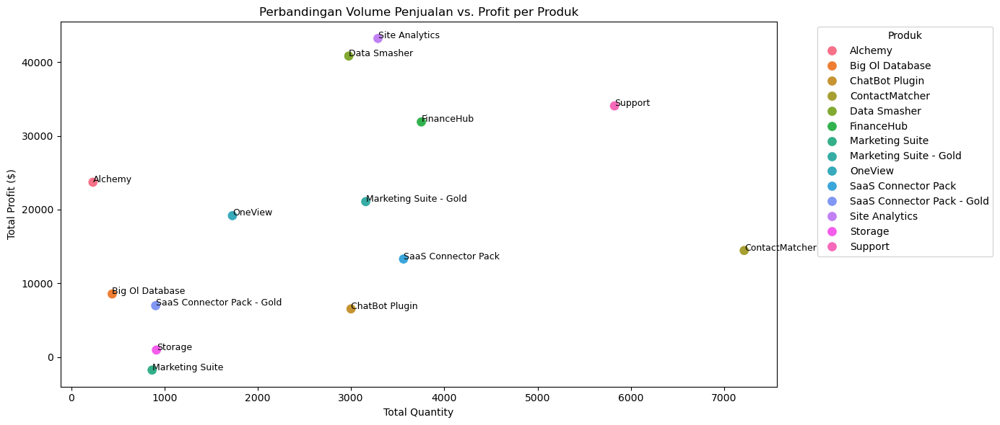

In [144]:
product_eff = df.groupby('Product').agg({
    'Profit': 'sum',
    'Quantity': 'sum'
}).reset_index()

# Scatterplot Volume vs Profit per Produk
plt.figure(figsize=(14, 6))
sns.scatterplot(data=product_eff, x='Quantity', y='Profit',
                hue='Product', s=100)

# Anotasi
for i in range(product_eff.shape[0]):
    plt.text(
        x=product_eff['Quantity'][i] + 0.5,
        y=product_eff['Profit'][i],
        s=product_eff['Product'][i],
        fontsize=9
    )

plt.title('Perbandingan Volume Penjualan vs. Profit per Produk')
plt.xlabel('Total Quantity')
plt.ylabel('Total Profit ($)')
plt.legend(title='Produk', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [145]:
# Data Kategori Efesiensi Berdasarkan Produk
product_eff = df.groupby('Product').agg({
    'Profit': 'sum',
    'Quantity': 'sum'
}).reset_index()
product_eff['Profit per Unit'] = product_eff['Profit'] / product_eff['Quantity']

def label_efficiency(row):
    if row['Profit per Unit'] >= 10:
        return 'High Efficiency'
    elif row['Profit per Unit'] >= 5:
        return 'Medium Efficiency'
    else:
        return 'Low Efficiency'

product_eff['Efficiency Category'] = product_eff.apply(label_efficiency, axis=1)
product_eff = product_eff.sort_values(by='Profit per Unit', ascending=False)
product_eff[['Product', 'Quantity', 'Profit', 'Profit per Unit', 'Efficiency Category']]

,Product,Quantity,Profit,Profit per Unit,Efficiency Category
0,Alchemy,234,23710.5929,101.327320,High Efficiency
1,Big Ol Database,440,8552.5085,19.437519,High Efficiency
4,Data Smasher,2976,40826.4255,13.718557,High Efficiency
11,Site Analytics,3289,43213.3335,13.138745,High Efficiency
8,OneView,1729,19175.3508,11.090428,High Efficiency
5,FinanceHub,3754,31888.4600,8.494529,Medium Efficiency
10,SaaS Connector Pack - Gold,906,6964.1767,7.686729,Medium Efficiency
7,Marketing Suite - Gold,3158,21079.9671,6.675100,Medium Efficiency
13,Support,5825,34061.2740,5.847429,Medium Efficiency
9,SaaS Connector Pack,3563,13293.2494,3.730915,Low Efficiency


Kesimpulan Analisis Efisiensi Penjualan per Produk :
- Tidak terdapat hubungan linear yang jelas antara jumlah produk terjual (**Quantity**) dan **Total Profit**. Ini menunjukkan bahwa volume tinggi tidak selalu berarti profit tinggi.

- Beberapa produk memiliki **volume penjualan tinggi namun profit yang rendah atau bahkan negatif**, seperti **Support** dan **SaaS Connector Pack**. Ini dapat mengindikasikan harga jual terlalu rendah, operasional tinggi, dan stategi promosi kurang efisien.

- Sebaliknya, ada produk dengan **volume rendah namun menghasilkan profit tinggi**, seperti **Alchemy** dan **Big Ol Database**, menunjukkan bahwa produk tersebut memiliki **margin keuntungan besar** dan bisa dianggap sebagai **produk premium**.

### **Analisis Pelanggan & Segmentasi**

- Siapa pelanggan paling menguntungkan?
- Bagaimana segmentasi pelanggan berdasarkan LRFMR?
- Apakah perilaku pelanggan berbeda antar industri?
- Apakah margin keuntungan lebih baik di sektor tertentu?

##### 1. Analisis LRFMR
LRFMR adalah metode segmentasi pelanggan yang merupakan pengembangan dari model klasik RFM (Recency, Frequency, Monetary). LRFMR menambahkan dua dimensi tambahan yang membuat analisis pelanggan jauh lebih tajam, khususnya dalam konteks B2B dan SaaS.

Singkatnya, LRFMR adalah:   
- L   : Lama hubungan pelanggan   
- R	: Sejak kapan terakhir transaksi   
- F	: Seberapa sering membeli  
- M	: Nilai total pembelian pelanggan  
- R	: Kontribusi keuntungan (profitabilitas)  

Dengan LRFMR:
- Analisis pelanggan jadi lebih tajam dan actionable.
- Hasilnya bisa memprioritaskan sumber daya ke pelanggan atau segmen paling menguntungkan.
- Wawasan yang didapat bisa langsung dihubungkan ke strategi produk, diskon, dan pelayanan pelanggan.

In [146]:
snapshot_date = df['Order Date'].max() + timedelta(days=1)

lrfmr = df.groupby('Customer ID').agg({
    'Order Date': [
        lambda x: (snapshot_date - x.max()).days,    # Recency
        lambda x: (x.max() - x.min()).days],           # Last (lifespan)
    'Order ID': 'nunique',                           # Frequency
    'Sales': 'sum',                                  # Monetary
    'Profit': 'sum'                                  # Revenue
}).reset_index()

lrfmr.columns = ['Customer ID', 'Recency', 'Last', 'Frequency', 'Monetary', 'Revenue']

# Skoring LRFMR (1-5)
lrfmr['R Score'] = pd.qcut(lrfmr['Recency'], 5, labels=[5,4,3,2,1]).astype(int)
lrfmr['L Score'] = pd.qcut(lrfmr['Last'], 5, labels=[1,2,3,4,5]).astype(int)
lrfmr['F Score'] = pd.qcut(lrfmr['Frequency'].rank(method='first'), 5, labels=[1,2,3,4,5]).astype(int)
lrfmr['M Score'] = pd.qcut(lrfmr['Monetary'], 5, labels=[1,2,3,4,5]).astype(int)
lrfmr['Rev Score'] = pd.qcut(lrfmr['Revenue'], 5, labels=[1,2,3,4,5]).astype(int)

lrfmr['LRFMR Segment'] = lrfmr[['L Score','R Score','F Score','M Score','Rev Score']].astype(str).agg('-'.join, axis=1)

def behavior_segment(row):
    if row['R Score'] >= 4 and row['F Score'] >= 4:
        return 'Loyal'
    elif row['R Score'] >= 4 and row['M Score'] >= 4:
        return 'Big Spender'
    elif row['R Score'] <= 2:
        return 'At Risk'
    else:
        return 'Others'

lrfmr['Behavior Segment'] = lrfmr.apply(behavior_segment, axis=1)

# Metadata pelanggan
customer_meta = df[['Customer ID', 'Customer', 'Industry', 'Segment']].drop_duplicates()
customer_meta.rename(columns={'Segment': 'Customer Segment'}, inplace=True)

lrfmr_full = pd.merge(lrfmr, customer_meta, on='Customer ID', how='left')
lrfmr_full

,Customer ID,Recency,Last,Frequency,Monetary,Revenue,R Score,L Score,F Score,M Score,Rev Score,LRFMR Segment,Behavior Segment,Customer,Industry,Customer Segment
0,1001,13,1343,31,12580.7664,2207.6585,3,2,1,1,3,2-3-1-1-3,Others,Abbott Laboratories,Healthcare,Enterprise
1,1001,13,1343,31,12580.7664,2207.6585,3,2,1,1,3,2-3-1-1-3,Others,Abbott Laboratories,Healthcare,SMB
2,1001,13,1343,31,12580.7664,2207.6585,3,2,1,1,3,2-3-1-1-3,Others,Abbott Laboratories,Healthcare,Strategic
3,1002,22,1349,76,27138.3644,3947.7866,2,2,5,4,5,2-2-5-4-5,At Risk,Aetna,Healthcare,SMB
4,1002,22,1349,76,27138.3644,3947.7866,2,2,5,4,5,2-2-5-4-5,At Risk,Aetna,Healthcare,Strategic
5,1003,2,1410,61,36137.9522,4073.6491,5,4,4,5,5,4-5-4-5-5,Loyal,Allstate,Finance,Strategic
6,1003,2,1410,61,36137.9522,4073.6491,5,4,4,5,5,4-5-4-5-5,Loyal,Allstate,Finance,SMB
7,1003,2,1410,61,36137.9522,4073.6491,5,4,4,5,5,4-5-4-5-5,Loyal,Allstate,Finance,Enterprise
8,1004,14,1434,62,23189.4775,2638.9045,3,5,5,4,3,5-3-5-4-3,Others,Amazon,Tech,SMB
9,1004,14,1434,62,23189.4775,2638.9045,3,5,5,4,3,5-3-5-4-3,Others,Amazon,Tech,Strategic


##### 2. Pelanggan Paling Menguntungkan

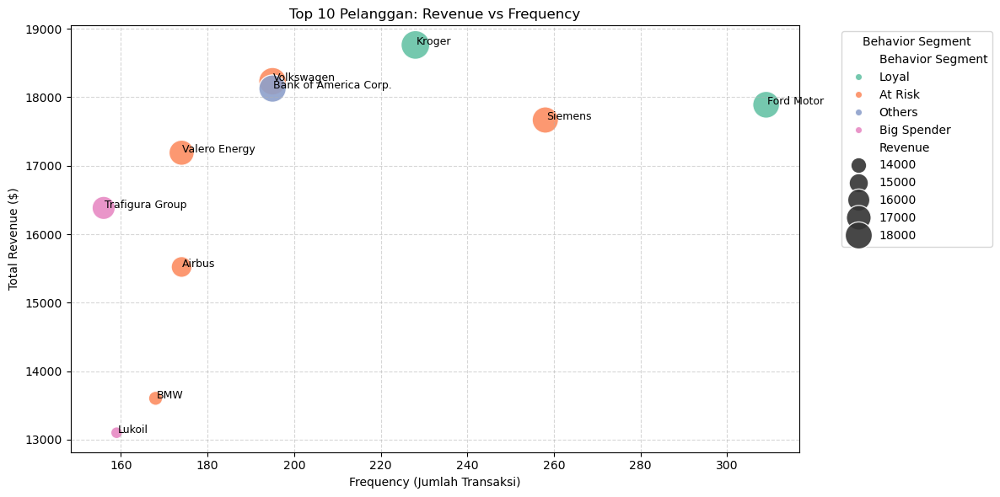

In [147]:
top_customers = lrfmr_full.groupby('Customer').agg({
    'Revenue': 'sum',
    'Frequency': 'sum',
    'Behavior Segment': lambda x: x.mode().iloc[0]}).reset_index()

top_customers = top_customers.sort_values(by='Revenue', ascending=False).head(10)

# Scatter plot
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=top_customers,
    x='Frequency',
    y='Revenue',
    hue='Behavior Segment',
    size='Revenue',
    sizes=(100, 600),
    palette='Set2',
    alpha=0.9)

# Anotasi
for i, row in top_customers.iterrows():
    plt.text(row['Frequency'] + 0.2, row['Revenue'], row['Customer'], fontsize=9)

plt.title('Top 10 Pelanggan: Revenue vs Frequency')
plt.xlabel('Frequency (Jumlah Transaksi)')
plt.ylabel('Total Revenue ($)')
plt.legend(title='Behavior Segment', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

Kesimpulan Pelanggan Paling Menguntungkan :
- **Ford Motor & Allianz** adalah pelanggan **paling aktif** dengan **frequency tertinggi**, menunjukkan loyalitas tinggi dan konsistensi transaksi.
- Meskipun frequency **Kroger** lebih rendah, tetap menghasilkan revenue tinggi, kemungkinan pembelian bernilai besar.
- **Trafigura Group** termasuk **Big Spender** dengan pembelian bernilai tinggi meskipun tidak terlalu sering.

 Pelanggan paling menguntungkan adalah Kroger, dengan total revenue 6,254.54 dan tergolong dalam segmen Loyal. Ini menunjukkan bahwa Kroger tidak hanya sering bertransaksi, tapi juga memberikan kontribusi keuntungan tertinggi. Cocok menjadi target untuk program loyalitas dan penawaran eksklusif.

##### 3. Segmentasi Pelanggan

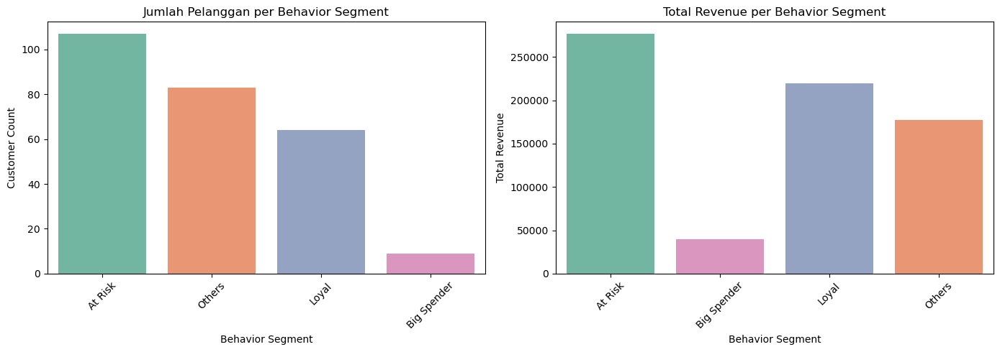

Rata-rata Revenue per Pelanggan untuk Setiap Behavior Segment:


,Behavior Segment,Avg Revenue per Customer
0,At Risk,2586.069589
1,Big Spender,4416.126333
2,Loyal,3430.286138
3,Others,2131.281478


In [148]:
# Jumlah pelanggan per Behavior Segment
segment_counts = lrfmr_full['Behavior Segment'].value_counts().reset_index()
segment_counts.columns = ['Behavior Segment', 'Customer Count']

segment_counts.columns = ['Behavior Segment', 'Customer Count']

# Total revenue per Behavior Segment
segment_revenue = lrfmr_full.groupby('Behavior Segment', as_index=False)['Revenue'].sum()
segment_revenue.columns = ['Behavior Segment', 'Total Revenue']

# Rata-rata revenue per Behavior Segment
segment_avg = lrfmr_full.groupby('Behavior Segment', as_index=False)['Revenue'].mean()
segment_avg.columns = ['Behavior Segment', 'Avg Revenue per Customer']

segments_order = ['At Risk', 'Others', 'Loyal', 'Big Spender']

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot jumlah pelanggan
sns.barplot(
    data=segment_counts,
    x='Behavior Segment', y='Customer Count',
    hue='Behavior Segment',
    hue_order=segments_order,
    palette='Set2',
    dodge=False,
    ax=axes[0])
axes[0].set_title('Jumlah Pelanggan per Behavior Segment')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)

# Plot total revenue
sns.barplot(
    data=segment_revenue,
    x='Behavior Segment', y='Total Revenue',
    hue='Behavior Segment',
    hue_order=segments_order,
    palette='Set2',
    dodge=False,
    ax=axes[1])
axes[1].set_title('Total Revenue per Behavior Segment')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()

print("Rata-rata Revenue per Pelanggan untuk Setiap Behavior Segment:")
segment_avg

Kesimpulan Segmen Pelanggan Berdasarkan LRFMR :
- At Risk
    - Jumlah pelanggan **paling besar**.
    - Memberikan **kontribusi revenue terbesar secara total**, meski **revenue per pelanggan rendah**.
    - Artinya, mereka mungkin **pelanggan lama** yang mulai **jarang bertransaksi**.
    - **Peluang untuk aktivasi ulang** melalui kampanye retensi atau penawaran khusus.

- Loyal
    - Jumlah pelanggan **cukup banyak**.
    - Memiliki **revenue total tinggi** dan juga **rata-rata revenue per pelanggan tinggi**.
    - Artinya, mereka **rutin membeli** dan masih aktif.    
    - Ini adalah **pelanggan inti** — harus dijaga melalui penghargaan, loyalti program, dan pelayanan yang konsisten.

- Others
    - Jumlahnya **lumayan**, tapi **kontribusi revenue lebih kecil**.
    - Kemungkinan **pelanggan baru** atau **tidak konsisten membeli**.
    - Butuh pendekatan untuk **meningkatkan loyalitas**, misalnya edukasi produk atau penawaran khusus.

- Big Spender
    - Jumlah pelanggan **paling sedikit**.
    - Tapi memiliki **rata-rata revenue tertinggi per pelanggan**.
    - Artinya, mereka sangat **berharga secara individual**.
    - Harus ada **strategi khusus** untuk menjaga mereka, seperti layanan premium atau personalisasi eksklusif.

##### 4. Distribusi Behavior Segment untuk tiap Industri

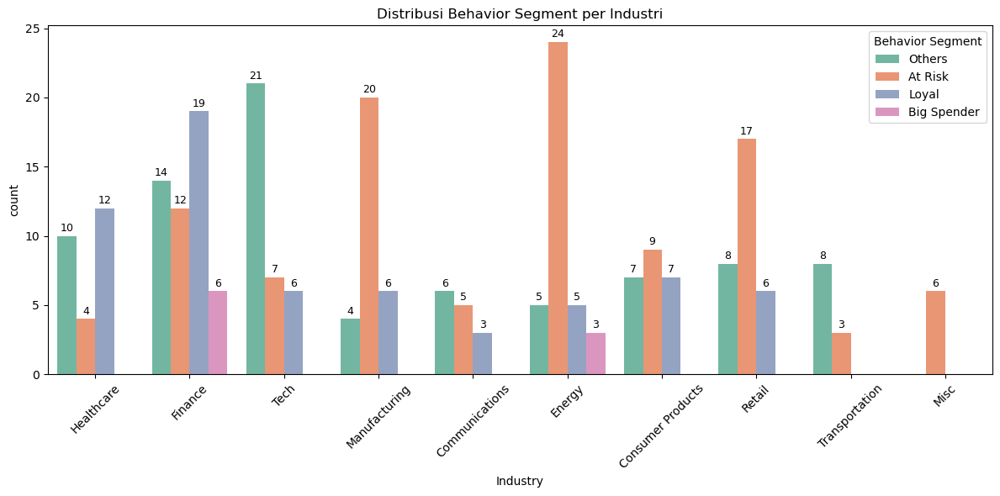

In [149]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(data=lrfmr_full, x='Industry', hue='Behavior Segment', palette='Set2')

# Anotasi
for container in ax.containers:
    ax.bar_label(container, label_type='edge', fontsize=9, padding=2)

plt.title('Distribusi Behavior Segment per Industri')
plt.xticks(rotation=45)
plt.legend(title='Behavior Segment')
plt.tight_layout()
plt.show()

Kesimpulan Distribusi Behavior Segment antar Industri :
- Dominasi Segmen “At Risk” di beberapa industri
    - **Energy** dan **Manufacturing** memiliki jumlah pelanggan *At Risk* yang sangat tinggi dibanding segmen lainnya, menunjukkan bahwa pelanggan di sektor ini cenderung **kurang aktif atau mulai tidak loyal**, sehingga perlu strategi *re-engagement*.

- Industri Tech dan Finance punya distribusi seimbang
    - **Finance** memiliki kombinasi pelanggan *Loyal* dan beberapa *Big Spender*, menunjukkan potensi jangka panjang.
    - **Tech** didominasi oleh segmen *Others*, kemungkinan banyak pelanggan baru atau belum menunjukkan pola perilaku yang jelas.

- Loyal customer banyak di Finance dan Healthcare
    - **Finance** dan **Healthcare** memiliki proporsi *Loyal* customer yang tinggi dan berpotensi besar untuk program *retensi pelanggan* dan *loyalty reward*.

- Big Spender hanya muncul di industri tertentu
    - Segmen *Big Spender* hanya terlihat di **Finance** dan **Energy**. Mereka adalah pelanggan bernilai tinggi, layak untuk strategi *VIP program*, *premium service*, dan *upselling*.

##### 5. Margin per Industri

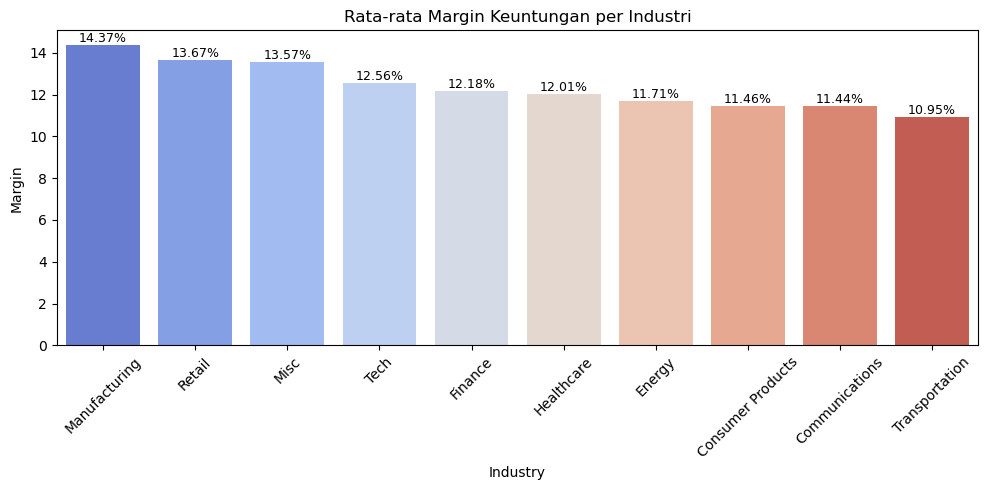

In [150]:
margin_per_customer = df.groupby('Customer ID')['Margin'].mean().reset_index()
lrfmr_full = pd.merge(lrfmr_full, margin_per_customer, on='Customer ID', how='left')

industry_margin = lrfmr_full.groupby('Industry')['Margin'].mean().reset_index().sort_values(by='Margin', ascending=False)

plt.figure(figsize=(10, 5))
ax = sns.barplot(data=industry_margin, x='Industry', y='Margin', palette='coolwarm')
plt.title('Rata-rata Margin Keuntungan per Industri')
plt.xticks(rotation=45)

# Anotasi
for bar in ax.patches:
    height = bar.get_height()
    x_pos = bar.get_x() + bar.get_width() / 2
    ax.text(x_pos, height + 0.001, f"{height:.2f}%", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

Kesimpulan Margin Keuntungan per Industri :
- **Manufacturing** merupakan industri dengan **margin keuntungan tertinggi**, menunjukkan efisiensi operasional atau pricing power yang kuat.
- **Retail** dan **Miscellaneous** juga memiliki margin tinggi, menjadikannya industri dengan potensi profitabilitas yang baik.
- **Transportation** memiliki **margin terendah**, yang mungkin disebabkan oleh struktur biaya tinggi atau persaingan harga yang ketat.
- Perbedaan margin antar industri berkisar **3.4%** dari yang tertinggi ke terendah — cukup signifikan untuk memengaruhi keputusan bisnis lintas industri.

## Dataset fix

In [154]:
# Simpan dataset bersih ke dalam file CSV
df.to_csv("SaaS-Sales_fix.csv", index=False)

In [155]:
lrfmr_full.to_csv("SaaS-Sales_lrfm.csv", index=False)   

## Kesimpulan

Hasil analisis ini telah menjabarkan bagaimana kondisi penjualan dan profitabilitas dalam dataset sehingga dapat diidentifikasi strategi yang dapat dilakukan untuk memaksimalkan performanya.

1. Performa Produk dan Industri
Analisis tren penjualan dan margin menunjukkan bahwa tidak semua produk dengan volume tinggi menghasilkan profit tinggi. Negara-negara seperti Amerika Serikat, Inggris, dan Kanada menjadi kontributor utama terhadap penjualan dan profit, sementara negara lain masih menyimpan potensi untuk ekspansi. Beberapa industri juga menunjukkan penjualan tinggi namun margin yang rendah.

Implikasi:
Fokus pada produk dan sektor dengan margin tinggi dan efisiensi kuat, serta evaluasi ulang strategi pada industri dengan profitabilitas rendah.

2. Perilaku dan Segmentasi Pelanggan
Hasil segmentasi LRFMR menunjukkan sebagian besar pelanggan berada dalam kategori berisiko (At Risk), sementara pelanggan loyal dan bernilai tinggi memberikan kontribusi signifikan terhadap profitabilitas. Ditemukan pula bahwa perilaku pembelian pelanggan bervariasi antar industri.

Implikasi:
Perlu adanya strategi retensi yang kuat, termasuk aktivasi ulang pelanggan berisiko dan program loyalitas untuk pelanggan bernilai tinggi.

3. Efektivitas Diskon
Analisis diskon menunjukkan bahwa diskon tinggi cenderung menurunkan profit dan tidak selalu meningkatkan volume penjualan secara signifikan.

Implikasi:
Diperlukan pendekatan diskon yang lebih selektif dan berbasis data, serta evaluasi efektivitas diskon berdasarkan produk dan industri.

Analisis ini menunjukkan bahwa peningkatan profitabilitas SaaS AWS dapat dicapai melalui optimalisasi portofolio produk, pendekatan berbasis nilai pelanggan, dan kebijakan diskon yang tepat sasaran. Pendekatan strategis ini diharapkan dapat mendorong pertumbuhan penjualan yang lebih berkelanjutan dan menguntungkan.

## Rekomendasi Bisnis Strategis

1. Optimalkan Momentum Musiman
- Fokus pada bulan November–Desember untuk kampanye besar karena performa penjualan dan profit tertinggi terjadi pada periode ini.
- Hindari penurunan di bulan Oktober dengan promosi atau reaktivasi pasar.

2. Fokus Pasar Berdasarkan Negara
- Pertahankan dominasi di US dan tingkatkan strategi di UK & Canada.
- Evaluasi pricing dan biaya di negara dengan penjualan tinggi tapi margin negatif (seperti Japan & France).
- Eksplorasi ekspansi di negara kecil dengan margin tinggi seperti Finland dan Ireland.

3. Prioritaskan Industri yang Efisien
- Retail dan Manufacturing adalah industri dengan margin dan penjualan yang tinggi, cocok untuk ekspansi.
- Waspadai industri seperti Tech dan Communications yang memiliki penjualan tinggi tapi margin rendah.
- Hindari ketergantungan pada industri Transportation yang margin-nya rendah.

4. Kelola Diskon secara Cermat
- Batasi diskon tinggi karena diskon >30% hampir selalu berujung pada profit negatif.
- Gunakan diskon hanya sebagai pemicu penjualan pada produk tertentu, bukan strategi utama.
- Fokus pada efektivitas diskon, bukan besarnya—diskon moderat seringkali lebih efektif.

5. Segmentasi Produk untuk Strategi Penjualan
- Promosikan produk high-margin seperti SaaS Connector Pack dan Support, meski quantity kecil.
- Evaluasi ulang produk ContactMatcher yang sering diberi diskon, quantity tinggi, tapi margin rendah.
- Hindari promosi berlebihan pada produk yang rugi seperti Marketing Suite.

6. Optimalkan Efisiensi Penjualan
- Fokus pada produk dengan profit tinggi per unit meskipun quantity rendah (seperti Alchemy & Big Ol Database).
- Evaluasi ulang strategi promosi untuk produk volume tinggi tapi profit rendah (seperti Support).

7. Segmentasi dan Aktivasi Pelanggan
- Retensi untuk segmen At Risk: Segmen terbesar, tapi mulai pasif. Gunakan kampanye re-engagement.
- Loyal dan Big Spender: Prioritaskan program loyalitas dan layanan eksklusif.
- Others: Edukasi produk dan pendekatan personal untuk meningkatkan keterlibatan.

8. Target Berdasarkan Industri Pelanggan
- Fokus pada Finance dan Healthcare untuk loyal customer.
- Bangun program VIP untuk Big Spender di Energy dan Finance.
- Strategi reaktivasi khusus untuk At Risk di Manufacturing dan Energy.